# 다양한 소리를 학습시키기 위해 오디오 데이터 증강
- train + unlabeled 조합
- 작성날짜: 2024.07.18
- 작성자: 박인애

## 💖 1. Install
필요한 라이브러리 설치

In [ ]:
!pip install  torchmetrics

In [ ]:
!pip install librosa

---

## 💖 2. Import
모델 학습 및 추론에 사용할 라이브러리들을 불러옵니다.

In [ ]:
import librosa

from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import random

from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

import torch
import torchmetrics
import os

import matplotlib.pyplot as plt

In [ ]:
# 구글 코랩을 이용할 경우
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

---

## 💖 3. Config
- 전역변수 선언
- EDA에 필요한 것들만

In [ ]:
class Config:
    #-----------------------------------------------
    # sampling rate
    '''인간의 음성 영역은 16000'''
    SR = 16000

    #-----------------------------------------------
    # feature 추출 개수
    N_MFCC = 20      # MFCC 추출 default는 20 (많은 논문에서 선택)
    N_MELS = 128     # Mel filter 개수
    N_CHROMA = 12

    #-----------------------------------------------
    # File Path
    '''
    - 데이터셋, 코드 등이 들어있는 기본 폴더 경로를 설정함
    - 걍 환경, 컴퓨터, 드라이브 경로 바뀔 때마다 매번 코드 수정하기 귀찮아서
    '''
    BASE_PATH = '/content/drive/MyDrive/hack/' # 구글 코랩 기준
    #BASE_PATH = './'  # 주피터 노트북 기준


    #-----------------------------------------------
    # Features 추출시 hyper parameter 설정값
    '''sepctogram, mel_spectogram, mfcc 매개변수'''
    N_FFT = 1024                 # FFT 크기, 주파수 해상도 설정  (1024, 2048, 4096, ...), .ogg가 아닌 .wav 파일로 실습할 경우 너무 크면 잘 안 되어서 100정도로 설정
    WINDOW_FUNCTION = 'hann'     # Hann 창 함수 사용
    HOP_LENGTH = (int)(N_FFT/4)  # 프레임 이동 거리, n_fft의 약 1/4 정도
    WIN_LENGTH = N_FFT

CONFIG = Config()

## 💖 4. Data Loading
- librosa.load 라이브러리를 이용하여 audio data를 디지털 값으로 불러오기
  - y: 파형의 amplitude 값 (signal)
  - sr: sampling rate

In [ ]:
filename = f'{CONFIG.BASE_PATH}temp/AXAEEYAI-real.ogg'
real_y, real_sr = librosa.load(filename, sr=CONFIG.SR) # 파형, sampling rate
ipd.Audio(filename) # 소리 출력

In [ ]:
filename = f'{CONFIG.BASE_PATH}temp/ABFJWPVZ-fake.ogg'
fake_y, fake_sr = librosa.load(filename, sr=CONFIG.SR)
ipd.Audio(filename) # 소리 출력

In [ ]:
real_y

array([-0.03634581, -0.05138551, -0.04126535, ..., -0.05354639,
       -0.05550615, -0.04088415], dtype=float32)

In [ ]:
real_sr

16000

## 💖 5. Visualization
- 전처리 전 데이터 시각화
- fake와 real 모두 plot해보고 특징 파악
- 겹치게 plot해보기

### 🌟 5-1. 심플 시각화

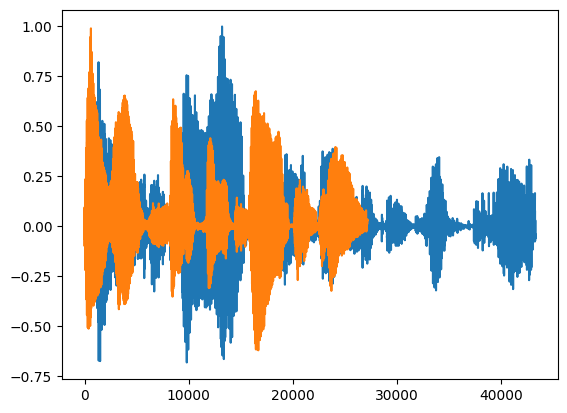

In [ ]:
plt.plot(np.array(real_y))
plt.plot(np.array(fake_y))

### 🌟 5-2. Display Waveform (파형 시각화)
- librosa.display 이용
- librosa.waveplot 라이브러리는 사라짐
- 최신에는 librosa.waveshoe 라이브러리 이용
- librosa가 업데이트되면서 wavplot 사라지고 waeshow로 대체

In [ ]:
import IPython.display as ipd
import librosa.display

import matplotlib.pyplot as plt
%matplotlib inline

- real

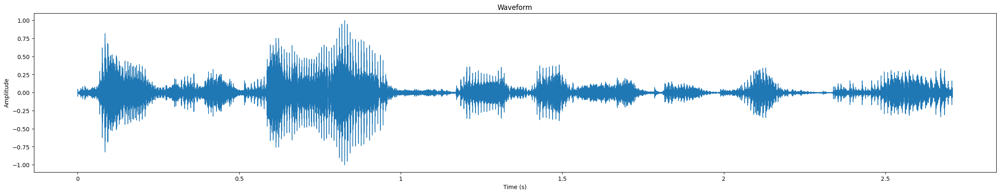

In [ ]:
plt.figure(figsize=(30, 5))
#librosa.display.waveplot(real_y, sr=real_sr)
librosa.display.waveshow(real_y, sr=real_sr)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Waveform")
plt.show()

- fake

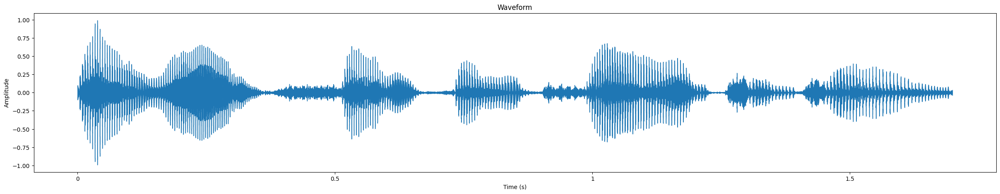

In [ ]:
plt.figure(figsize=(30, 5))
librosa.display.waveshow(fake_y, sr=fake_sr)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Waveform")
plt.show()

### 🌟 주파수 시각화
- FFT (Power Spectrum)

- real

Text(0.5, 1.0, 'Power spectrum')

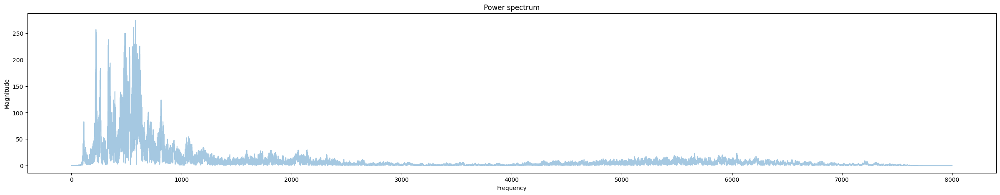

In [ ]:
# Perform Fourier Transform
fft = np.fft.fft(real_y)

# Calculate ABS values on complex numbers to get magnitude
spectrum = np.abs(fft)

# Create Frequency Variable
f = np.linspace(0, real_sr, len(spectrum))

# Take half of the spectrum and frequency
left_spectrum = spectrum[:int(len(spectrum)/2)]
left_f = f[:int(len(spectrum)/2)]

# Plot spectrum
plt.figure(figsize=(30, 5))
plt.plot(left_f, left_spectrum, alpha=0.4)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power spectrum")

- fake

Text(0.5, 1.0, 'Power spectrum')

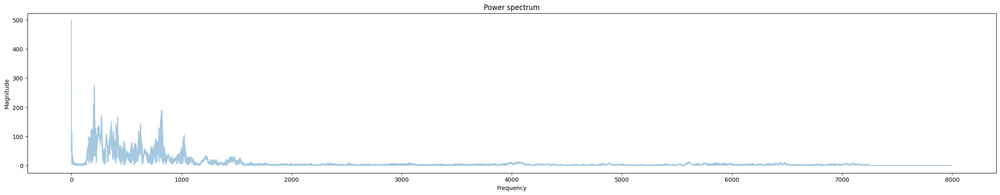

In [ ]:
# Perform Fourier Transform
fft = np.fft.fft(fake_y)

# Calculate ABS values on complex numbers to get magnitude
spectrum = np.abs(fft)

# Create Frequency Variable
f = np.linspace(0, fake_sr, len(spectrum))

# Take half of the spectrum and frequency
left_spectrum = spectrum[:int(len(spectrum)/2)]
left_f = f[:int(len(spectrum)/2)]

# Plot spectrum
plt.figure(figsize=(30, 5))
plt.plot(left_f, left_spectrum, alpha=0.4)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Power spectrum")

### 🌟 MFCCs

- N_MFCC=20

MFCCs.shape : (20, 170)


Text(0.5, 1.0, 'MFCCs')

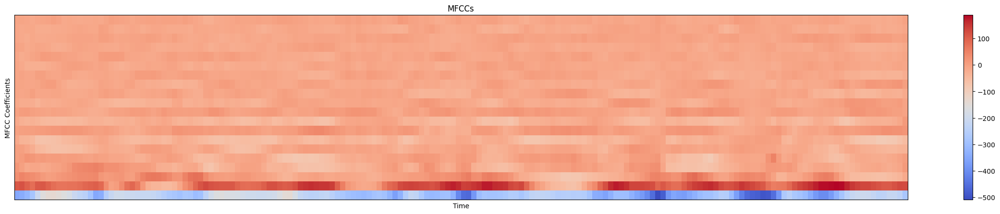

In [ ]:
MFCCs = librosa.feature.mfcc(y=real_y, sr=real_sr, n_fft=CONFIG.N_FFT, hop_length=CONFIG.HOP_LENGTH, n_mfcc=20)
print('MFCCs.shape :', MFCCs.shape)

# Display MFCCs
plt.figure(figsize=(30, 5))
librosa.display.specshow(MFCCs, sr=real_sr, hop_length=CONFIG.HOP_LENGTH)
plt.xlabel("Time")
plt.ylabel("MFCC Coefficients")
plt.colorbar()
plt.title("MFCCs")

MFCCs.shape : (20, 107)


Text(0.5, 1.0, 'MFCCs')

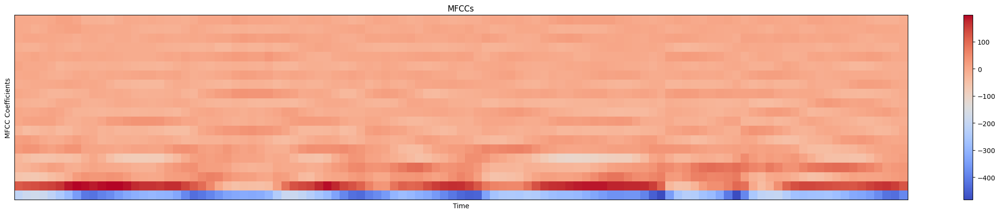

In [ ]:
MFCCs = librosa.feature.mfcc(y=fake_y, sr=fake_sr, n_fft=CONFIG.N_FFT, hop_length=CONFIG.HOP_LENGTH, n_mfcc=20)
print('MFCCs.shape :', MFCCs.shape)

# Display MFCCs
plt.figure(figsize=(30, 5))
librosa.display.specshow(MFCCs, sr=fake_sr, hop_length=CONFIG.HOP_LENGTH)
plt.xlabel("Time")
plt.ylabel("MFCC Coefficients")
plt.colorbar()
plt.title("MFCCs")

- N_MFCC=50

MFCCs.shape : (50, 170)


Text(0.5, 1.0, 'MFCCs')

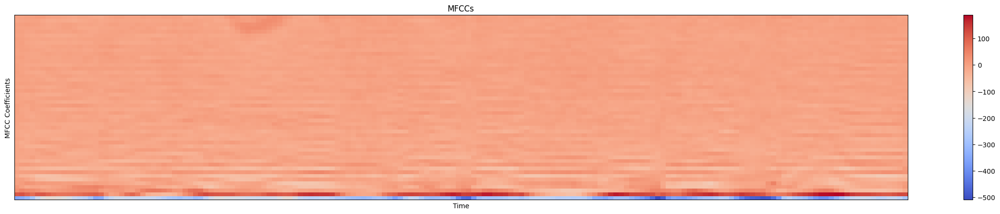

In [ ]:
MFCCs = librosa.feature.mfcc(y=real_y, sr=real_sr, n_fft=CONFIG.N_FFT, hop_length=CONFIG.HOP_LENGTH, n_mfcc=50)
print('MFCCs.shape :', MFCCs.shape)

# Display MFCCs
plt.figure(figsize=(30, 5))
librosa.display.specshow(MFCCs, sr=real_sr, hop_length=CONFIG.HOP_LENGTH)
plt.xlabel("Time")
plt.ylabel("MFCC Coefficients")
plt.colorbar()
plt.title("MFCCs")

MFCCs.shape : (50, 107)


Text(0.5, 1.0, 'MFCCs')

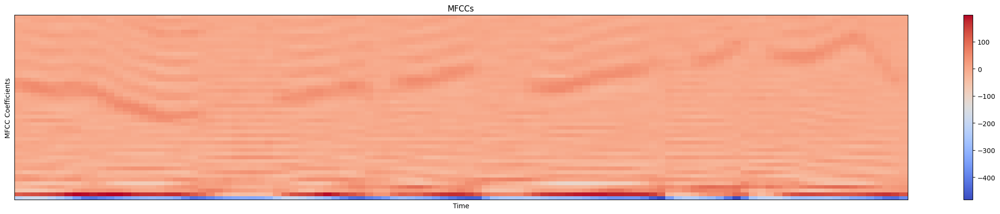

In [ ]:
MFCCs = librosa.feature.mfcc(y=fake_y, sr=fake_sr, n_fft=CONFIG.N_FFT, hop_length=CONFIG.HOP_LENGTH, n_mfcc=50)
print('MFCCs.shape :', MFCCs.shape)

# Display MFCCs
plt.figure(figsize=(30, 5))
librosa.display.specshow(MFCCs, sr=fake_sr, hop_length=CONFIG.HOP_LENGTH)
plt.xlabel("Time")
plt.ylabel("MFCC Coefficients")
plt.colorbar()
plt.title("MFCCs")

- N_MFCC=100

MFCCs.shape : (100, 170)


Text(0.5, 1.0, 'MFCCs')

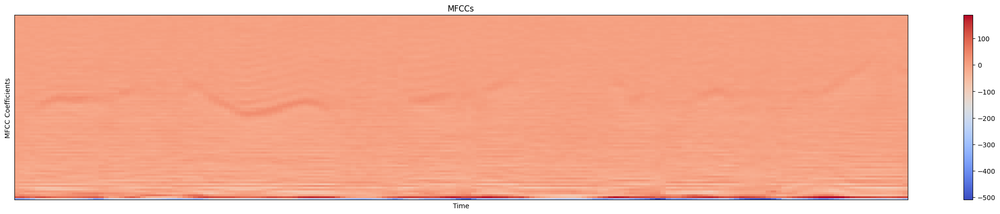

In [ ]:
MFCCs = librosa.feature.mfcc(y=real_y, sr=real_sr, n_fft=CONFIG.N_FFT, hop_length=CONFIG.HOP_LENGTH, n_mfcc=100)
print('MFCCs.shape :', MFCCs.shape)

# Display MFCCs
plt.figure(figsize=(30, 5))
librosa.display.specshow(MFCCs, sr=real_sr, hop_length=CONFIG.HOP_LENGTH)
plt.xlabel("Time")
plt.ylabel("MFCC Coefficients")
plt.colorbar()
plt.title("MFCCs")

MFCCs.shape : (100, 107)


Text(0.5, 1.0, 'MFCCs')

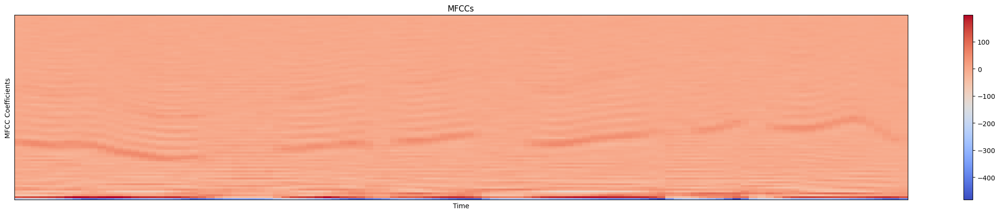

In [ ]:
MFCCs = librosa.feature.mfcc(y=fake_y, sr=fake_sr, n_fft=CONFIG.N_FFT, hop_length=CONFIG.HOP_LENGTH, n_mfcc=100)
print('MFCCs.shape :', MFCCs.shape)

# Display MFCCs
plt.figure(figsize=(30, 5))
librosa.display.specshow(MFCCs, sr=fake_sr, hop_length=CONFIG.HOP_LENGTH)
plt.xlabel("Time")
plt.ylabel("MFCC Coefficients")
plt.colorbar()
plt.title("MFCCs")

### 🌟 Mel spectrogram

In [ ]:
mels = librosa.feature.melspectrogram(y=real_y, sr=real_sr, n_mels=128, fmax=8000)
print(mels)
print()

mels_db = librosa.power_to_db(mels, ref=np.max)
print(mels_db)
print()

log_mels = librosa.amplitude_to_db(mels, ref=np.max)
print(mels)
print()

log_mels_db = librosa.power_to_db(log_mels, ref=np.max)
print(log_mels_db)

[[3.2463367e-03 8.2114129e-04 2.3169421e-05 ... 6.1813562e-06
  3.0835163e-05 4.5905975e-03]
 [5.7333922e-03 1.4090324e-03 6.2579574e-04 ... 6.2448482e-05
  2.2497111e-04 7.3003005e-03]
 [1.4180545e-02 3.8614059e-03 4.0907231e-03 ... 3.8485360e-04
  1.0912430e-03 1.7085867e-02]
 ...
 [2.1039820e-04 1.3788855e-03 7.2710840e-03 ... 9.7883560e-05
  3.4668887e-04 4.9489073e-04]
 [5.2552758e-05 3.4026266e-04 5.1299611e-04 ... 1.1198651e-05
  1.0519379e-04 1.9978224e-04]
 [9.7702086e-06 3.7279863e-06 1.7464077e-06 ... 3.8846210e-08
  4.7525046e-07 3.6545243e-06]]

[[-56.2722   -62.24196  -77.736984 ... -80.       -76.495674 -54.767445]
 [-53.80202  -59.896927 -63.421814 ... -73.43092  -67.86487  -52.75273 ]
 [-49.86921  -55.518684 -55.268135 ... -65.53318  -61.00692  -49.05977 ]
 ...
 [-68.155716 -59.990852 -52.770145 ... -71.47904  -65.98674  -64.44105 ]
 [-74.18018  -66.06799  -64.284996 ... -80.       -71.16624  -68.38057 ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.

In [ ]:
def visual_mel_spectro(y, sr, N_MELS, N_FFT, HOP_LENGTH):
    # Mel 스펙트로그램 계산
    mel_specgram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=N_FFT, hop_length=HOP_LENGTH, n_mels=N_MELS, fmin=0.0, fmax=sr/2)

    # Log 변환
    log_mel_specgram = librosa.amplitude_to_db(mel_specgram, ref=np.max)

    #
    power_mel_specgram = librosa.power_to_db(mel_specgram, ref=np.max)

    # 시각화
    plt.figure(figsize=(12, 8))

    # Mel 스펙트로그램 시각화
    plt.subplot(3, 1, 1)
    librosa.display.specshow(mel_specgram, sr=sr, hop_length=CONFIG.HOP_LENGTH, x_axis='time', y_axis='linear', cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')

    # Log Mel 스펙트로그램 시각화
    plt.subplot(3, 1, 2)
    librosa.display.specshow(log_mel_specgram, sr=sr, hop_length=CONFIG.HOP_LENGTH, x_axis='time', y_axis='mel', cmap='viridis', vmin=np.nanmin(log_mel_specgram), vmax=np.nanmax(log_mel_specgram))
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Mel Frequency')

    # Power Mel 스펙트로그램 시각화
    plt.subplot(3, 1, 3)
    librosa.display.specshow(power_mel_specgram, sr=sr, hop_length=CONFIG.HOP_LENGTH, x_axis='time', y_axis='mel', cmap='viridis', vmin=np.nanmin(log_mel_specgram), vmax=np.nanmax(log_mel_specgram))
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Mel Frequency')

    plt.tight_layout()
    plt.show()

#### N_MELS=128, N_FFT=1024

In [ ]:
print(CONFIG.N_MELS, CONFIG.N_FFT, CONFIG.HOP_LENGTH)

128 1024 256


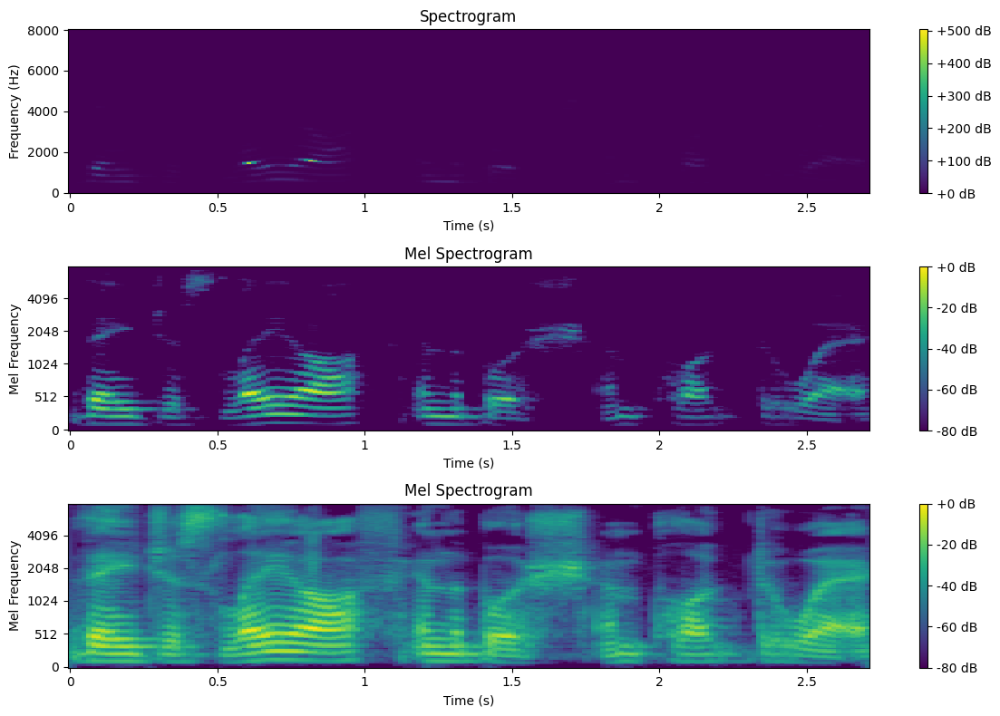

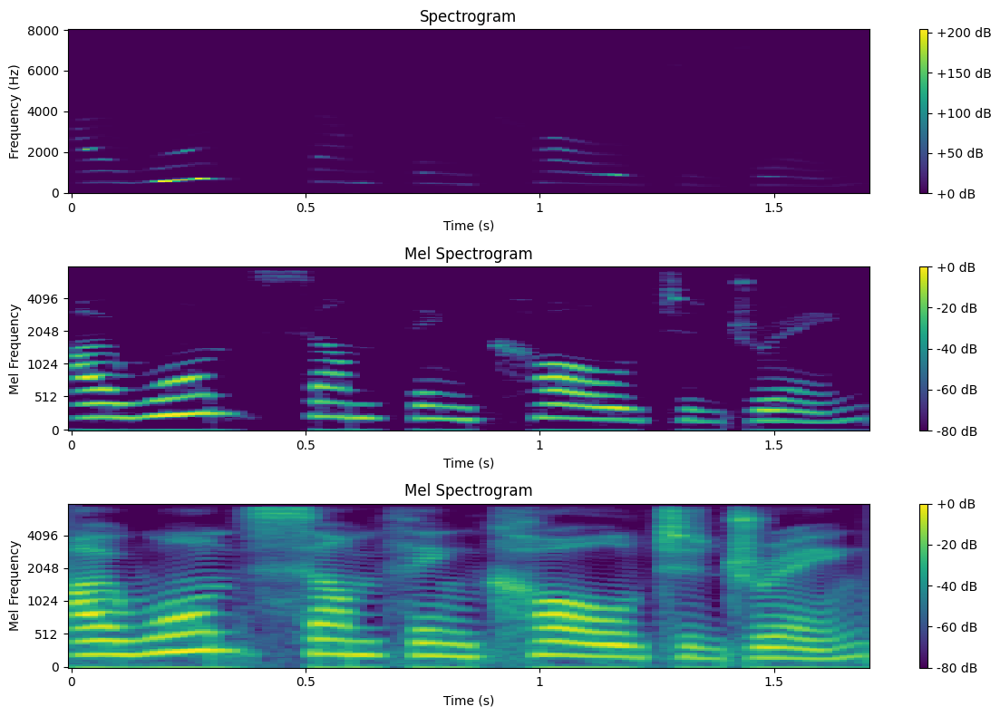

In [ ]:
visual_mel_spectro(real_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, CONFIG.HOP_LENGTH)
visual_mel_spectro(fake_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, CONFIG.HOP_LENGTH)

- N_MELS=50, N_FFT=400

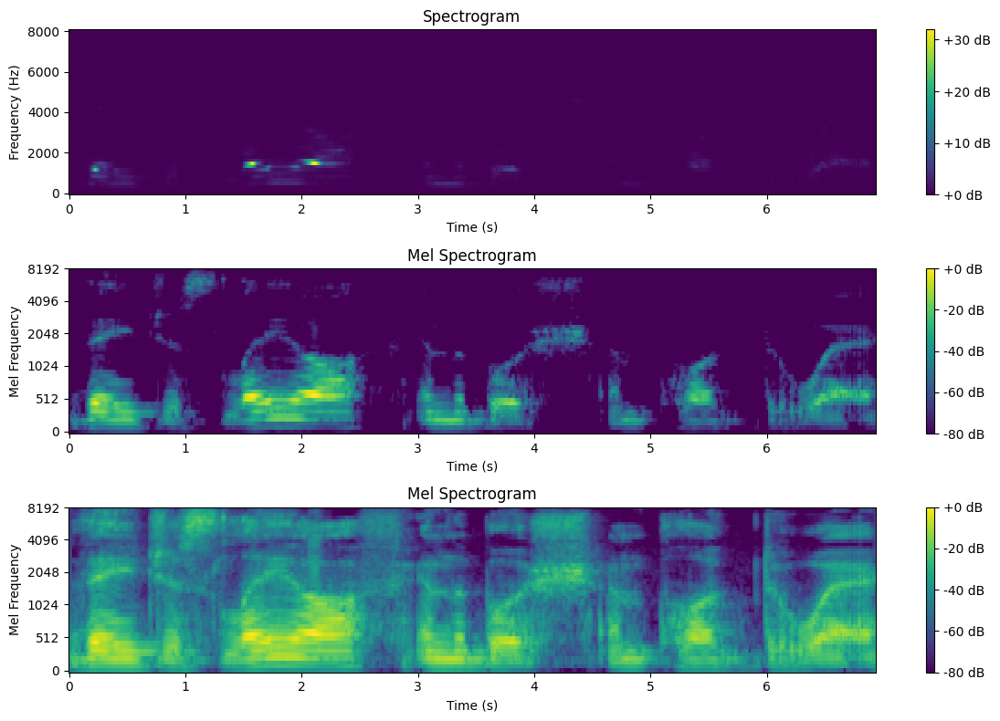

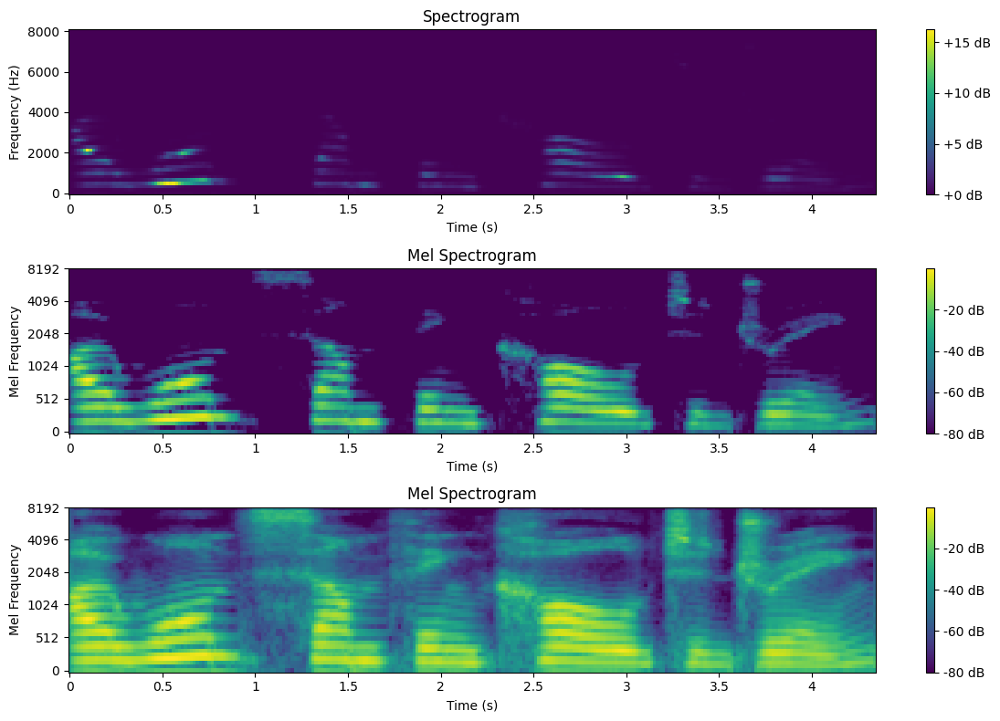

In [ ]:
visual_mel_spectro(real_y, real_sr, 50, 400, (int)(400/4))
visual_mel_spectro(fake_y, fake_sr, 50, 400, (int)(400/4))

- N_MELS=128, N_FFT=8000

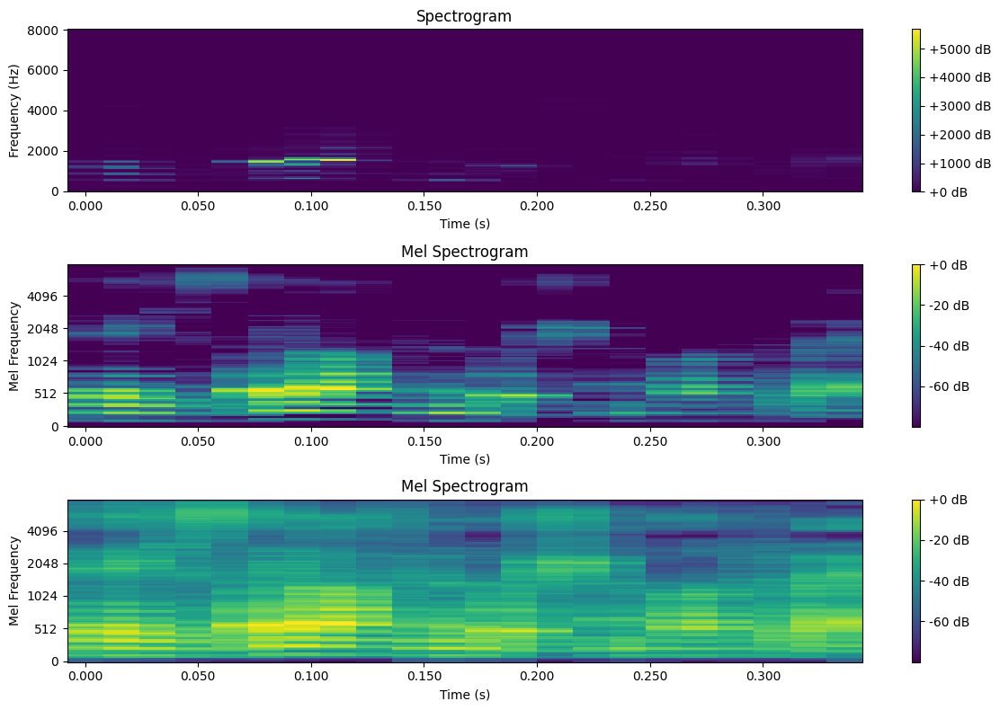

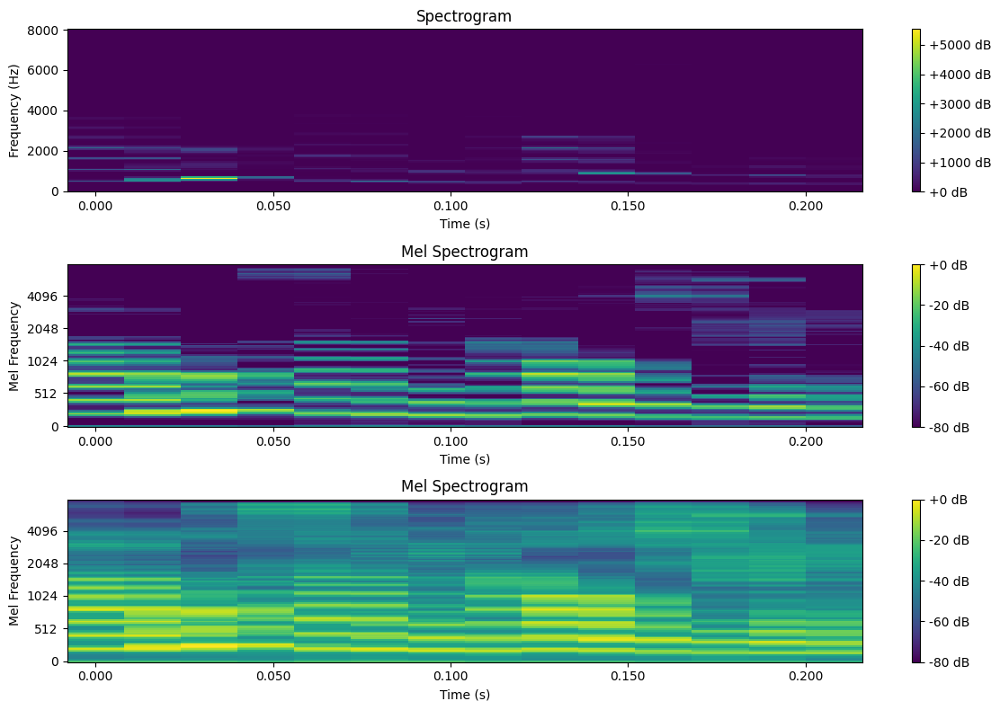

In [ ]:
visual_mel_spectro(real_y, real_sr, 128, 8000, (int)(8000/4))
visual_mel_spectro(fake_y, fake_sr, 128, 8000, (int)(8000/4))

- N_MELS=128, N_FFT=4096

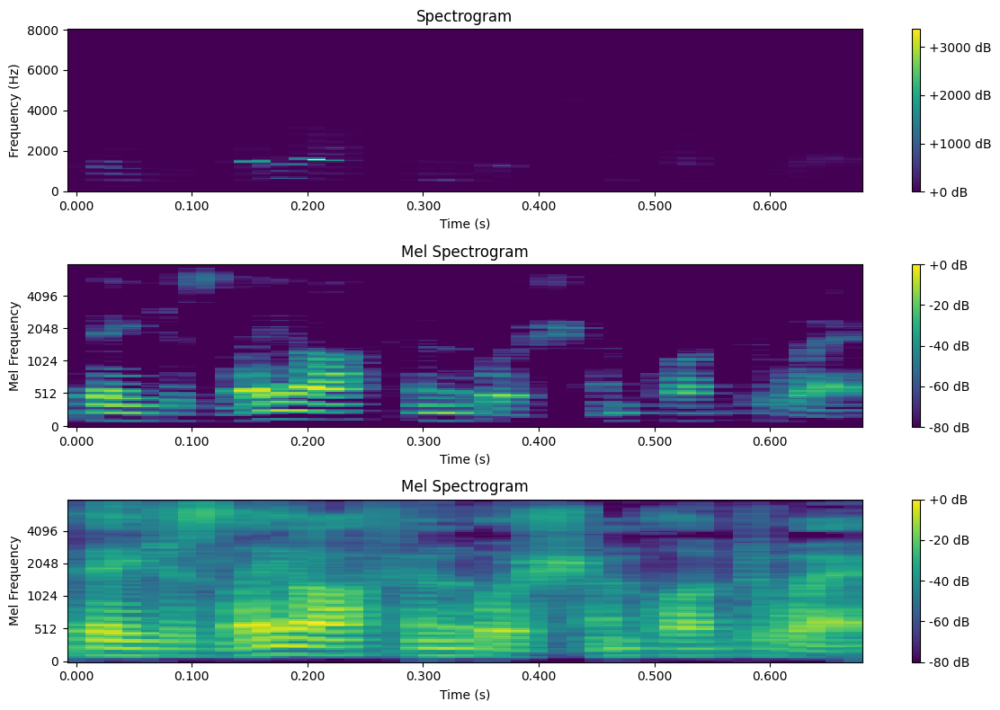

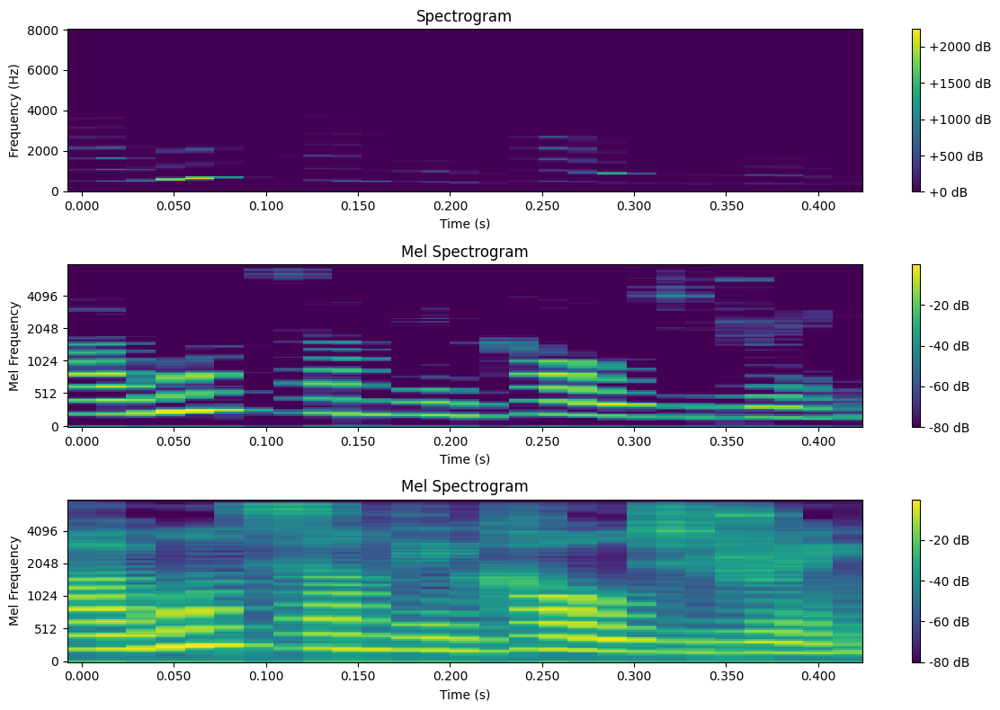

In [ ]:
visual_mel_spectro(real_y, real_sr, 128, 4096, (int)(4096/4))
visual_mel_spectro(fake_y, fake_sr, 128, 4096, (int)(4096/4))

- N_MELS=128, N_FFT=2048

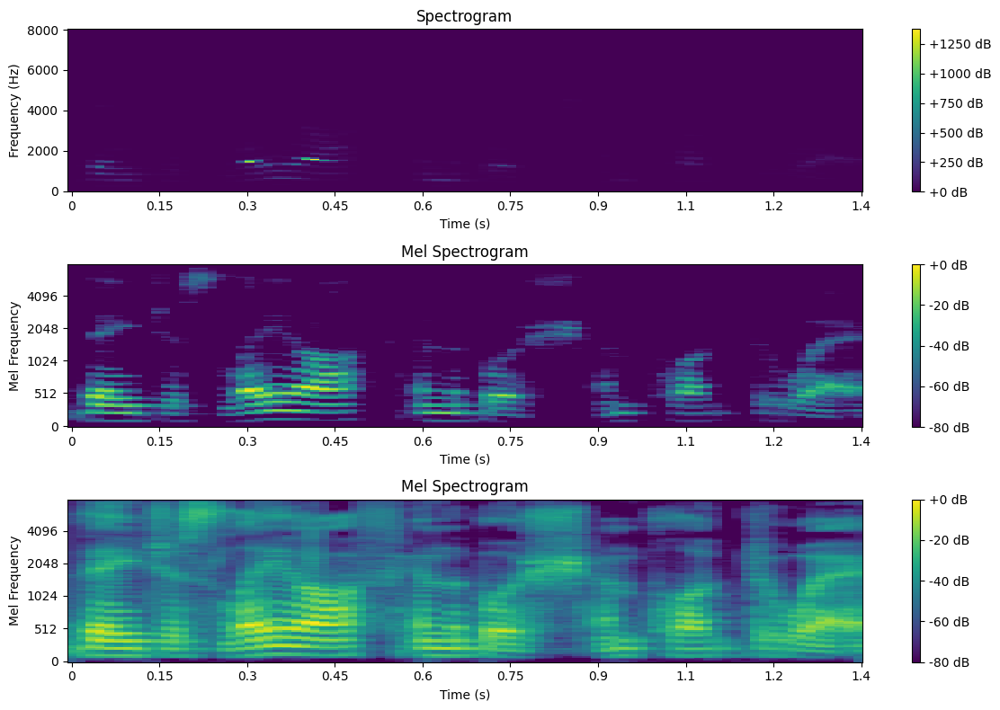

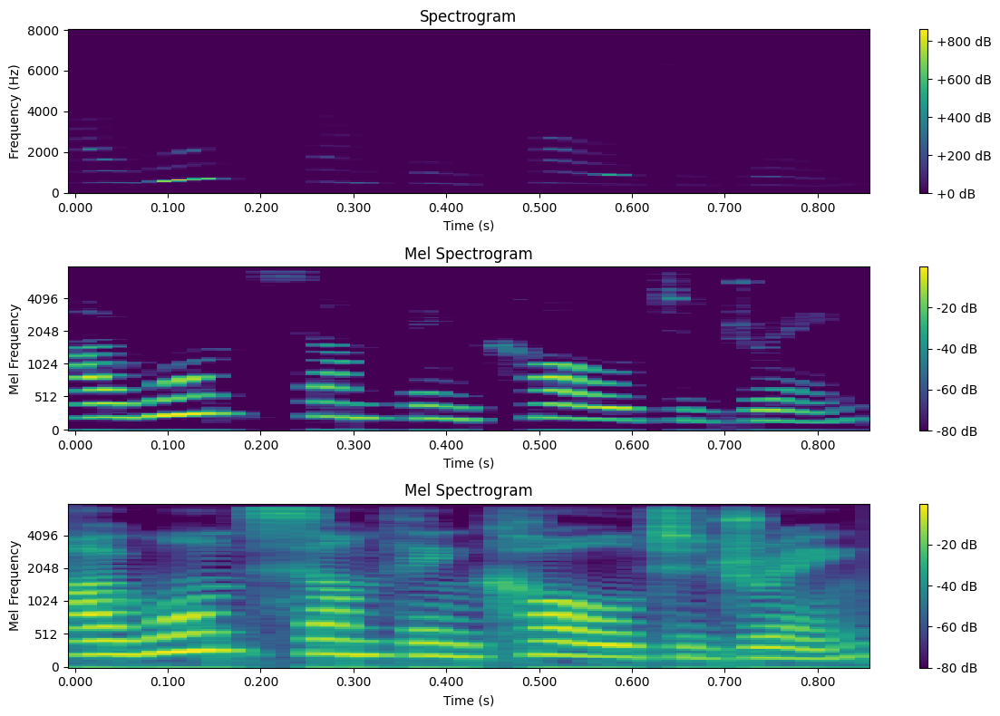

In [ ]:
visual_mel_spectro(real_y, real_sr, 128, 2048, (int)(2048/4))
visual_mel_spectro(fake_y, fake_sr, 128, 2048, (int)(2048/4))

N_MELS=128, N_FFT=512

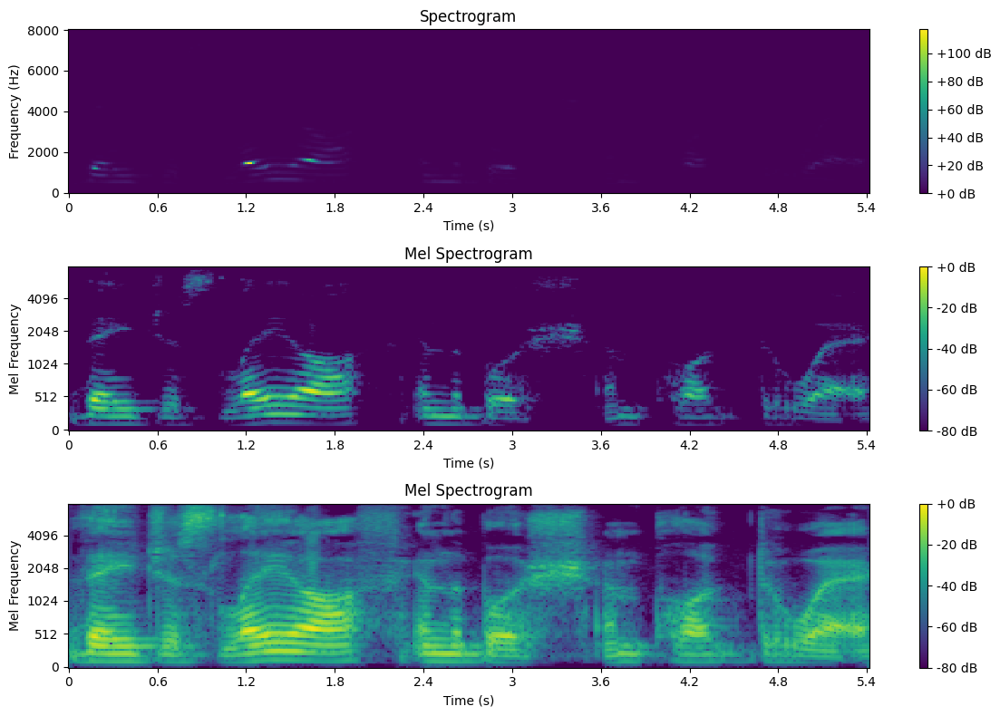

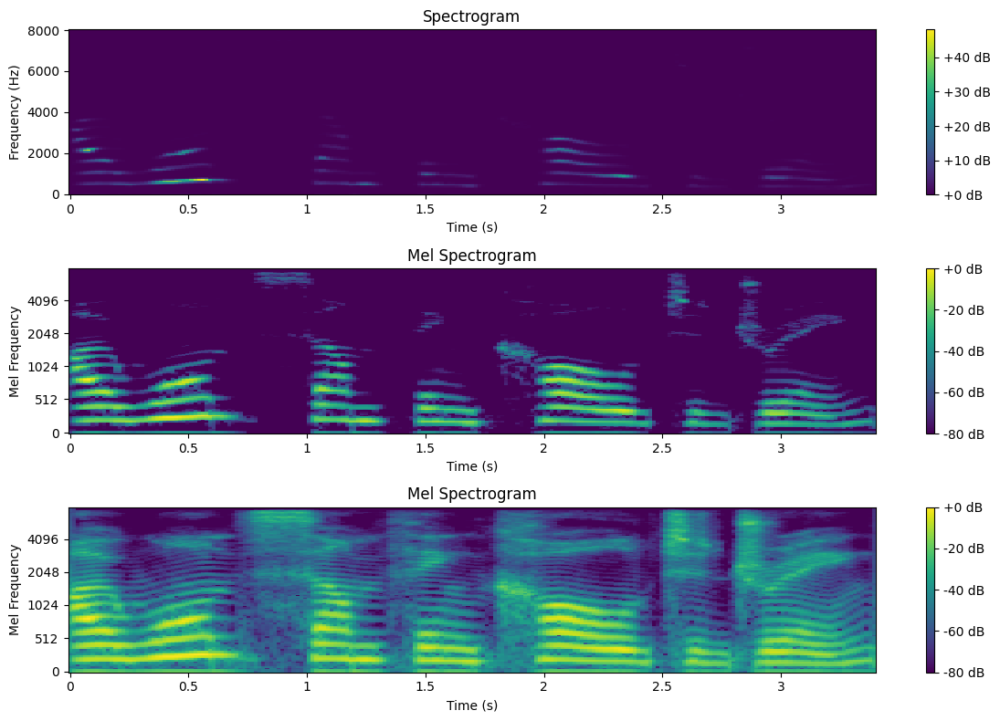

In [ ]:
CONFIG.N_MELS = 128
CONFIG.N_FFT = 512
visual_mel_spectro(real_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(fake_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))

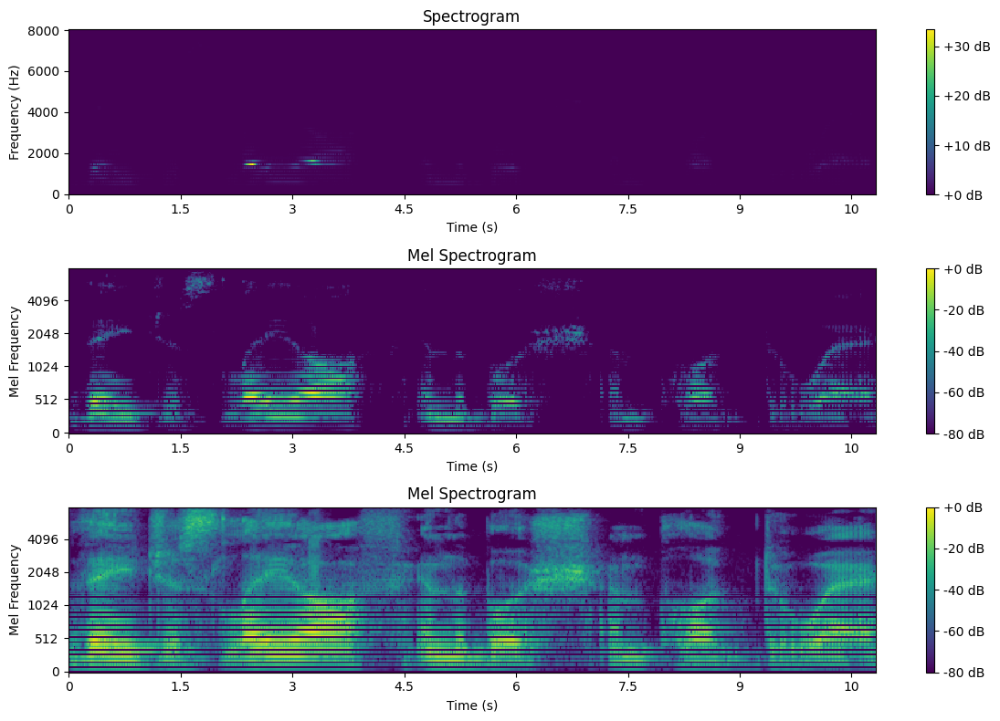

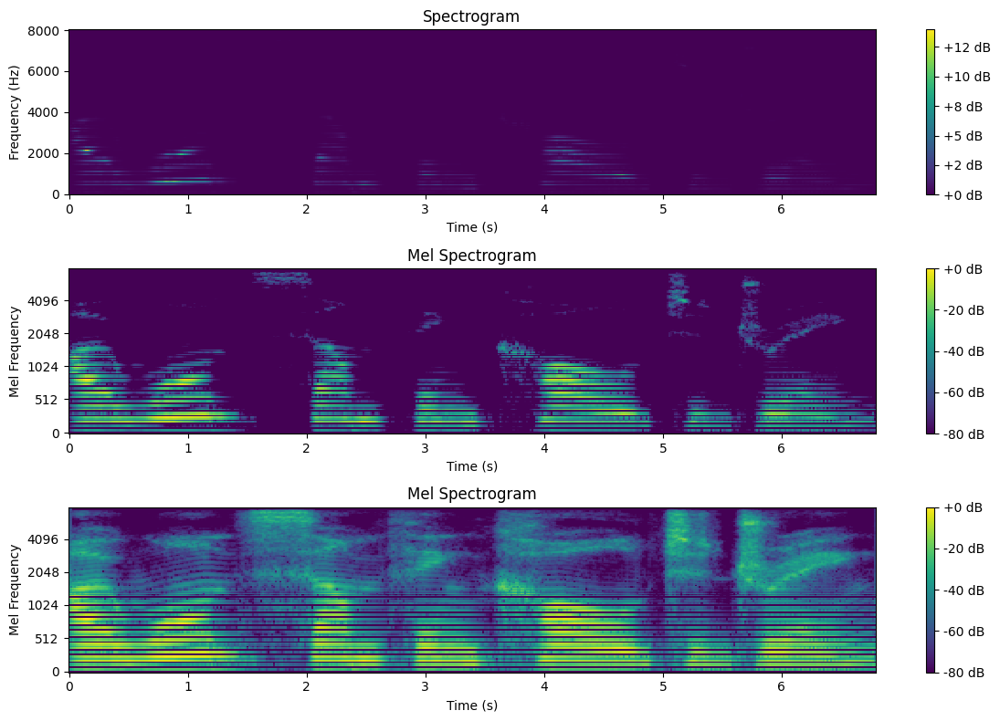

In [ ]:
CONFIG.N_MELS = 128
CONFIG.N_FFT = 256
visual_mel_spectro(real_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(fake_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))

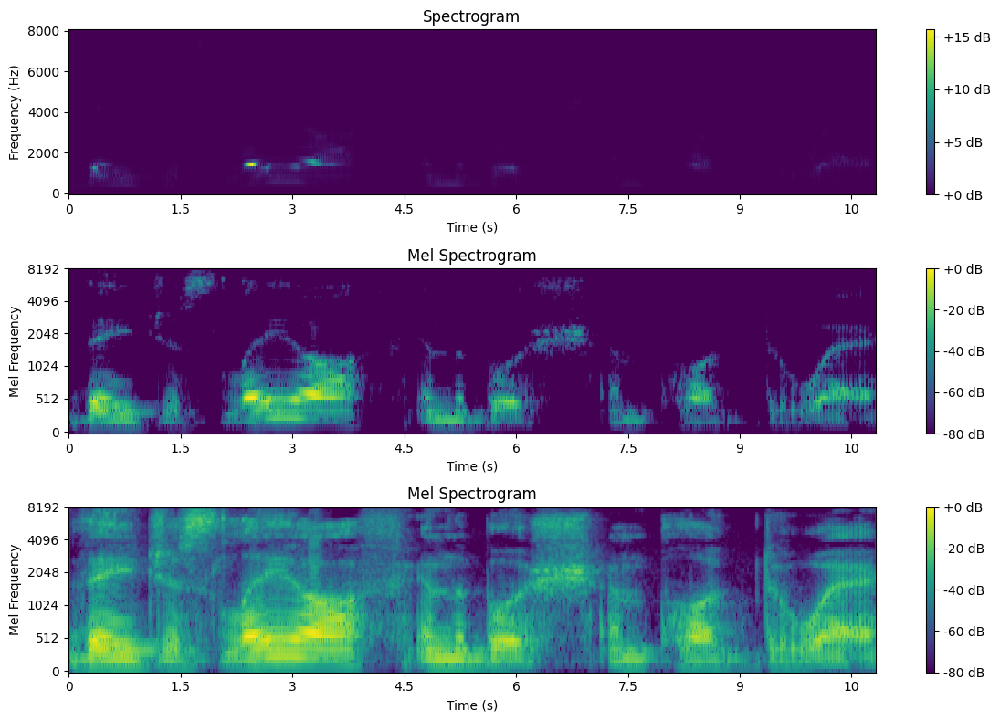

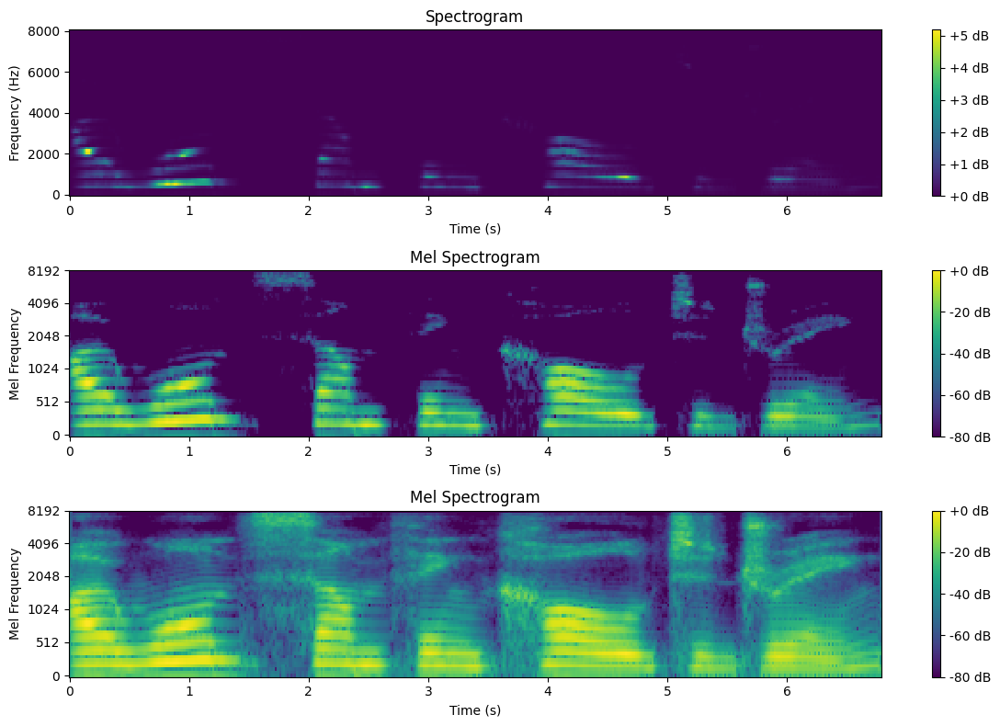

In [ ]:
CONFIG.N_MELS = 64
CONFIG.N_FFT = 256
visual_mel_spectro(real_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(fake_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))

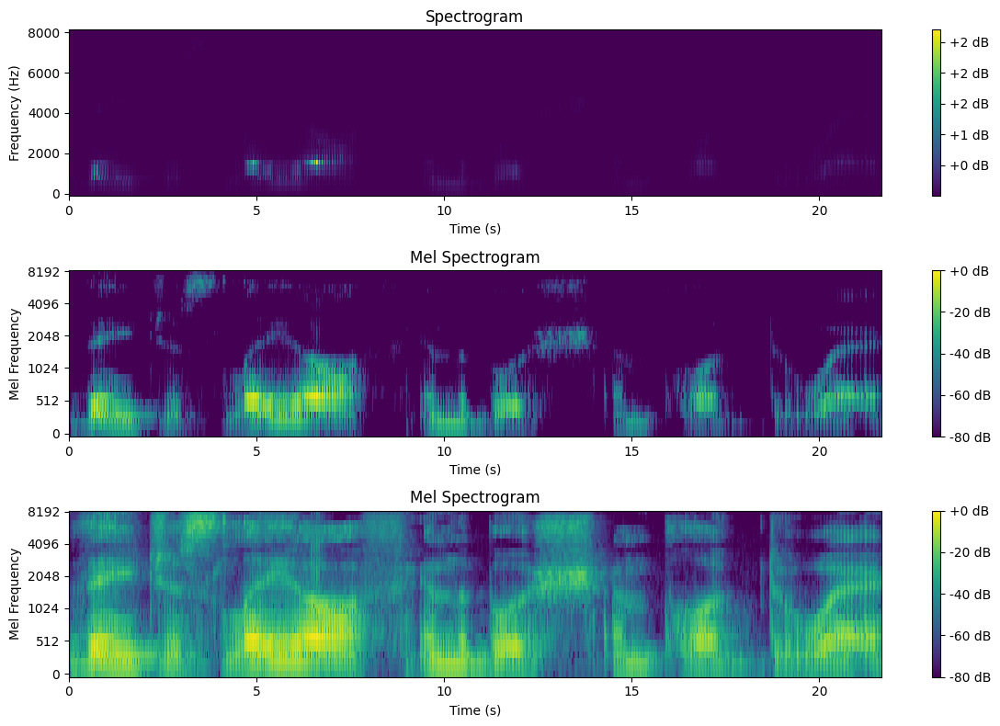

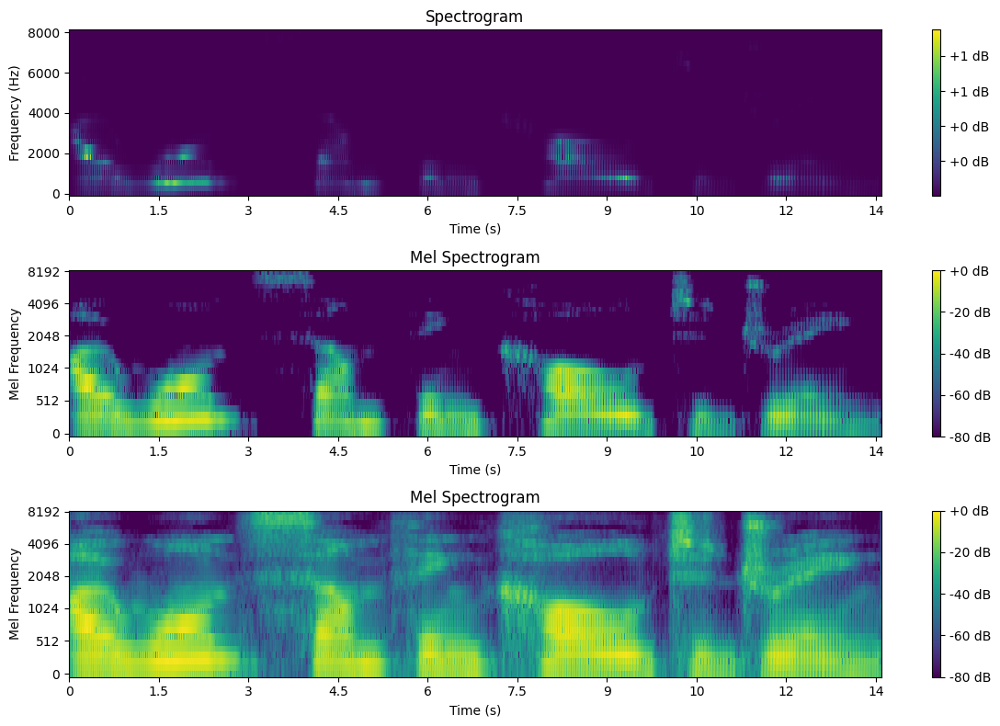

In [ ]:
CONFIG.N_MELS = 32
CONFIG.N_FFT = 128
visual_mel_spectro(real_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(fake_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))

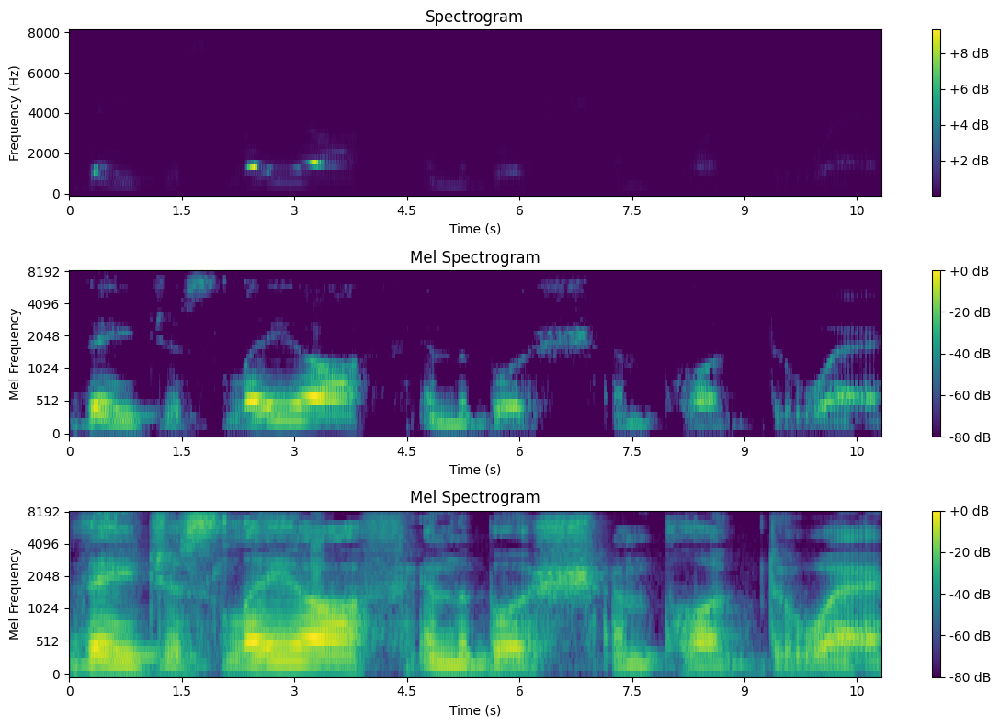

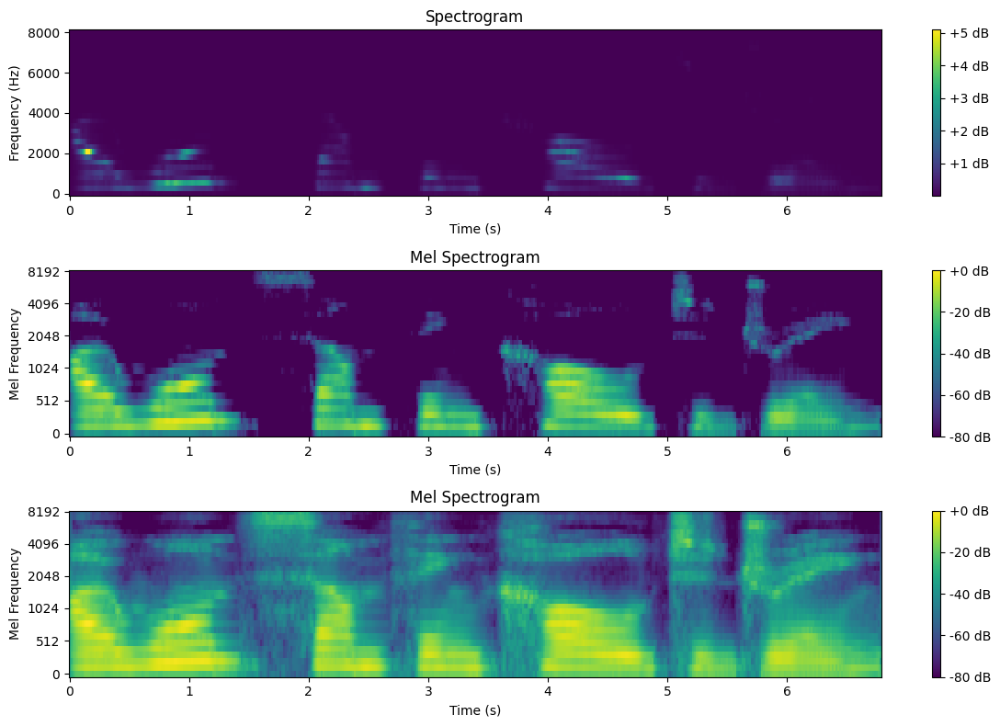

In [ ]:
CONFIG.N_MELS = 32
CONFIG.N_FFT = 256
visual_mel_spectro(real_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(fake_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))

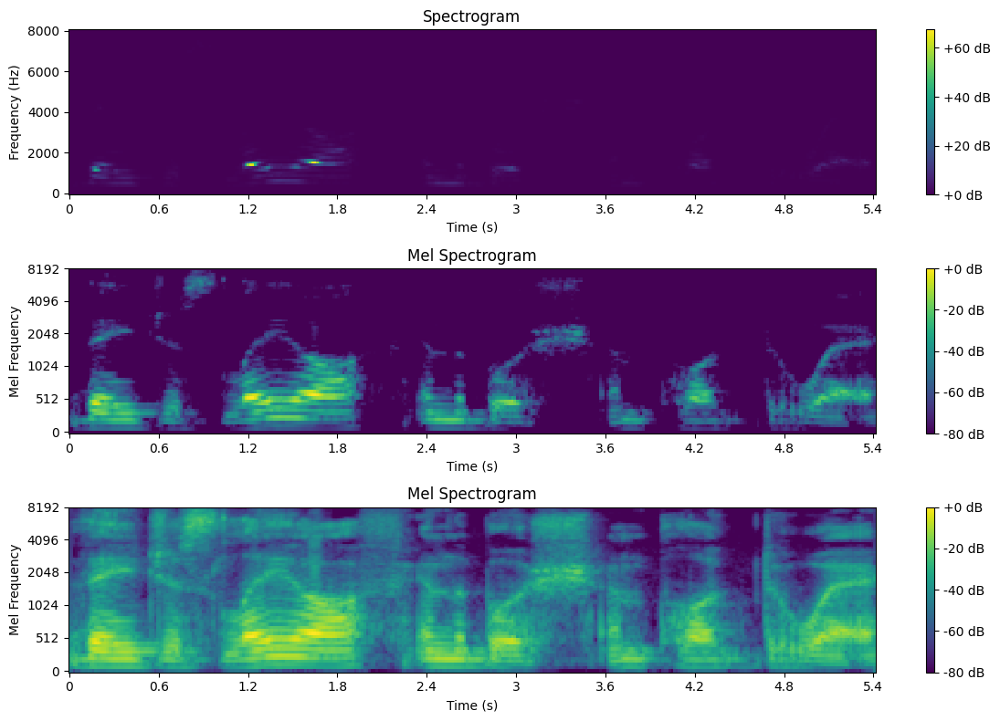

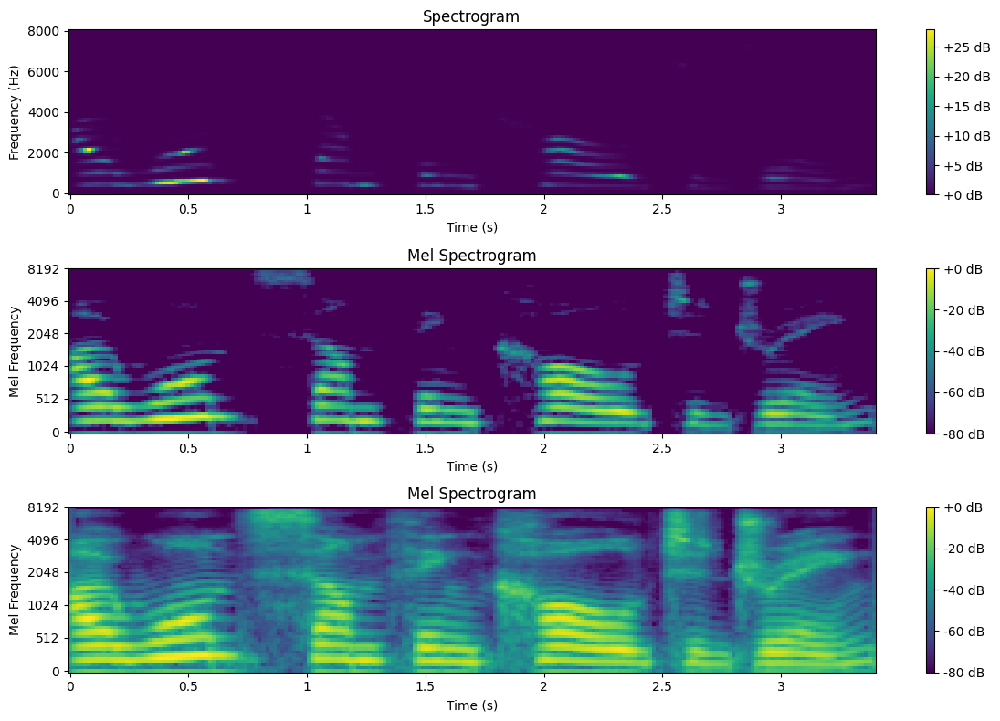

In [ ]:
CONFIG.N_MELS = 64
CONFIG.N_FFT = 512
visual_mel_spectro(real_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(fake_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))

In [ ]:
- 32, 256
- 128, 512
- 64, 512

# TEST

In [ ]:
filename = f'{CONFIG.BASE_PATH}temp/TEST_00000-realreal.ogg'
#filename = f'{CONFIG.BASE_PATH}temp/TEST_00008-real.ogg'
test_realreal_y, test_realreal_sr = librosa.load(filename, sr=CONFIG.SR) # 파형, sampling rate
ipd.Audio(filename) # 소리 출력


In [ ]:
filename = f'{CONFIG.BASE_PATH}temp/TEST_00001-realfake.ogg'
test_realfake_y, test_realfake_sr = librosa.load(filename, sr=CONFIG.SR) # 파형, sampling rate
ipd.Audio(filename) # 소리 출력


In [ ]:
filename = f'{CONFIG.BASE_PATH}temp/TEST_00002-fakefake.ogg'
test_fakefake_y, test_fakefake_sr = librosa.load(filename, sr=CONFIG.SR) # 파형, sampling rate
ipd.Audio(filename) # 소리 출력


In [ ]:
filename = f'{CONFIG.BASE_PATH}temp/TEST_00015-outlier.ogg'
test_outlier_y, test_outlier_sr = librosa.load(filename, sr=CONFIG.SR) # 파형, sampling rate
ipd.Audio(filename) # 소리 출력


In [ ]:
# outlier + real
filename = f'{CONFIG.BASE_PATH}temp/TEST_00007.ogg'
test_y, test_sr = librosa.load(filename, sr=CONFIG.SR) # 파형, sampling rate
ipd.Audio(filename) # 소리 출력

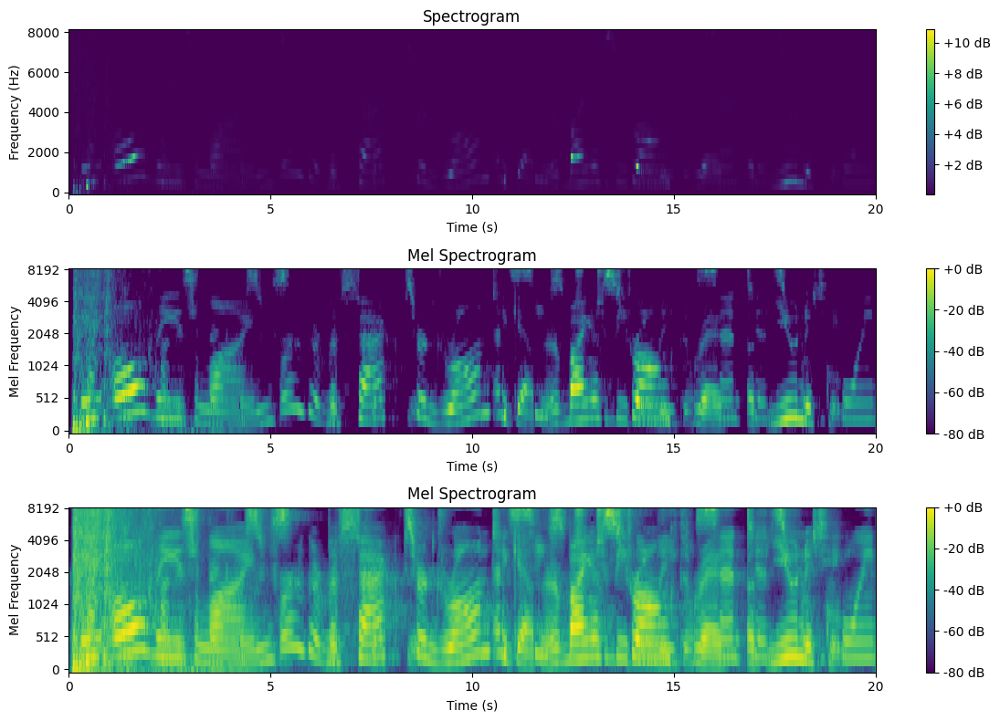

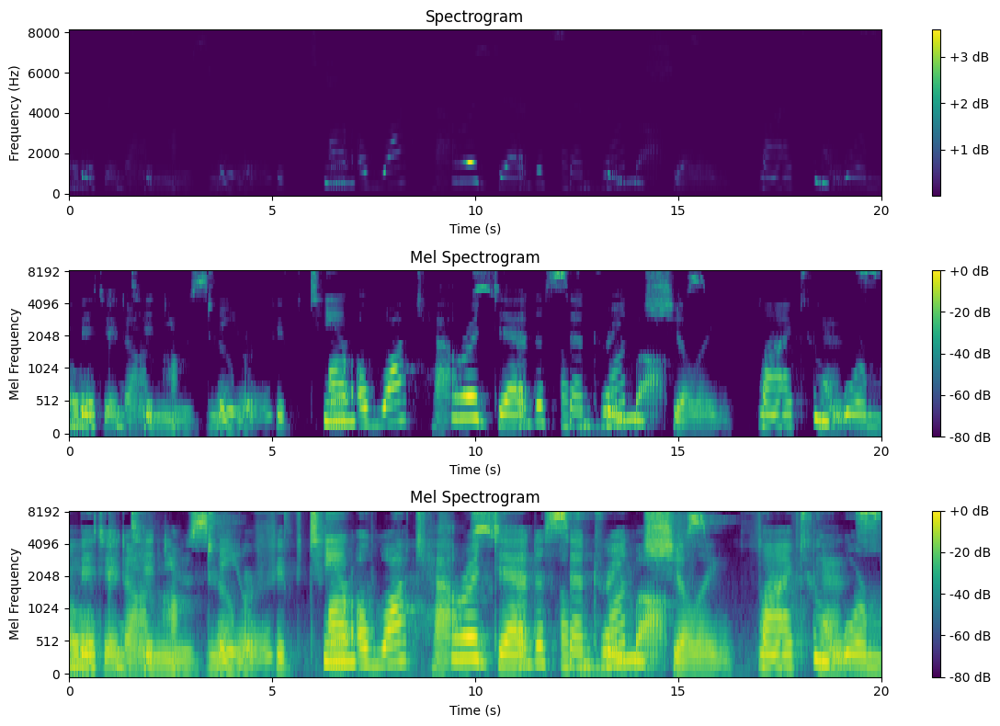

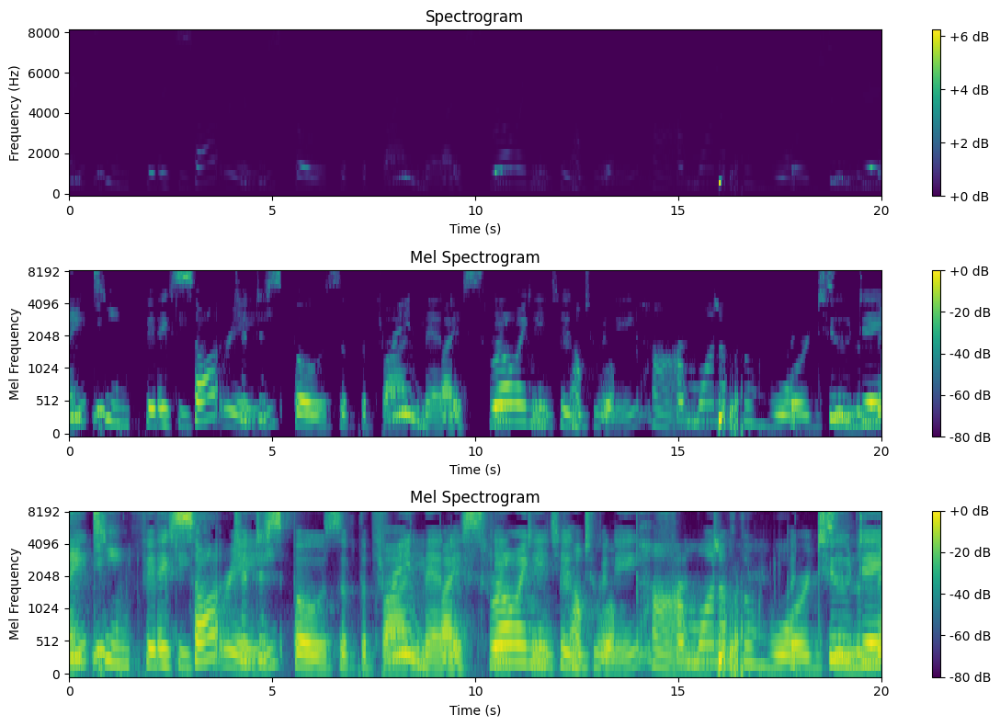

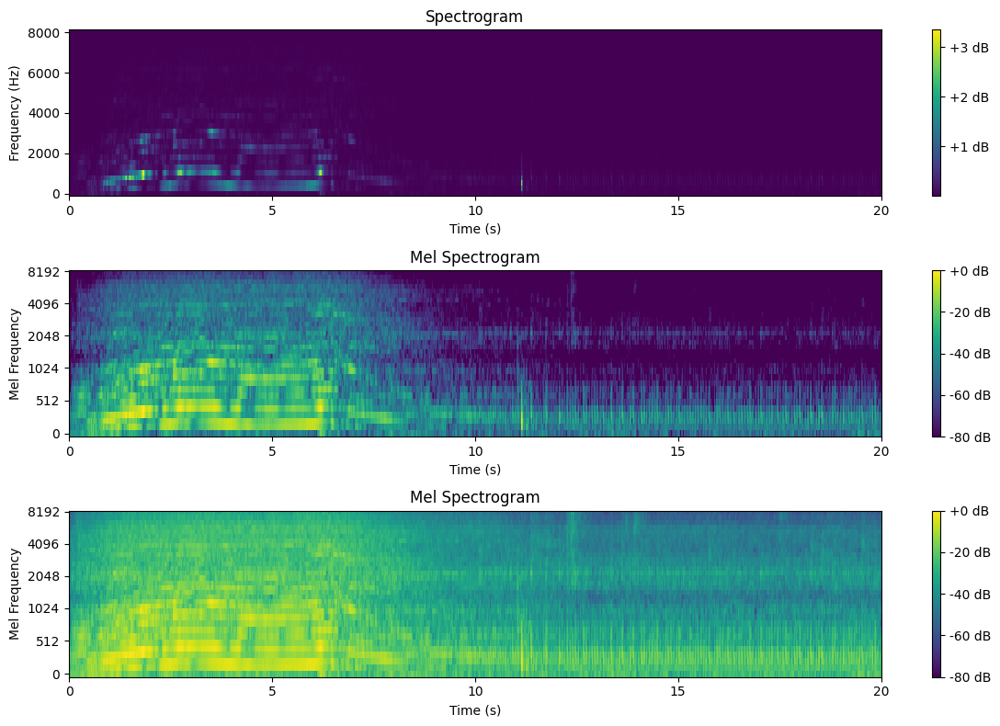

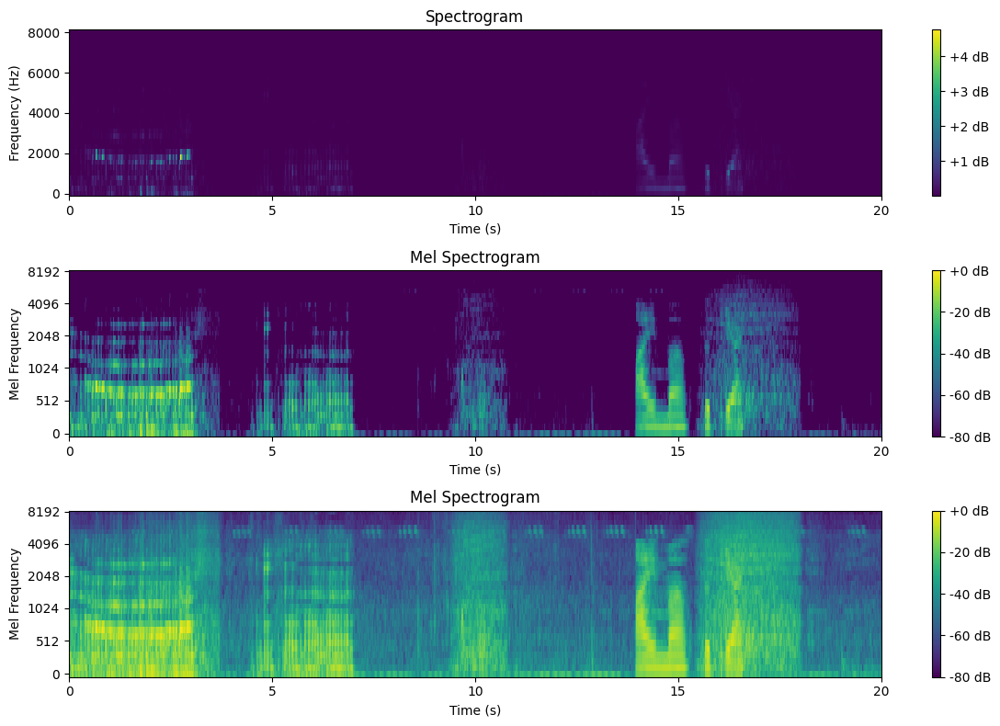

In [ ]:
CONFIG.N_MELS = 32
CONFIG.N_FFT = 256
visual_mel_spectro(test_realreal_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(test_realfake_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(test_fakefake_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(test_outlier_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(test_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))

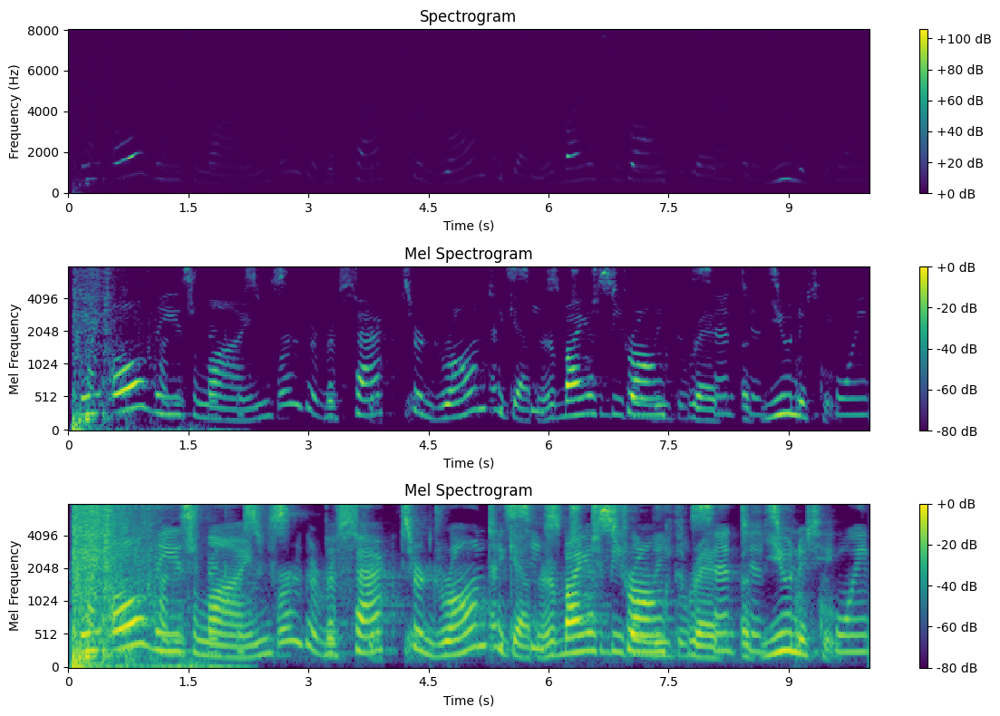

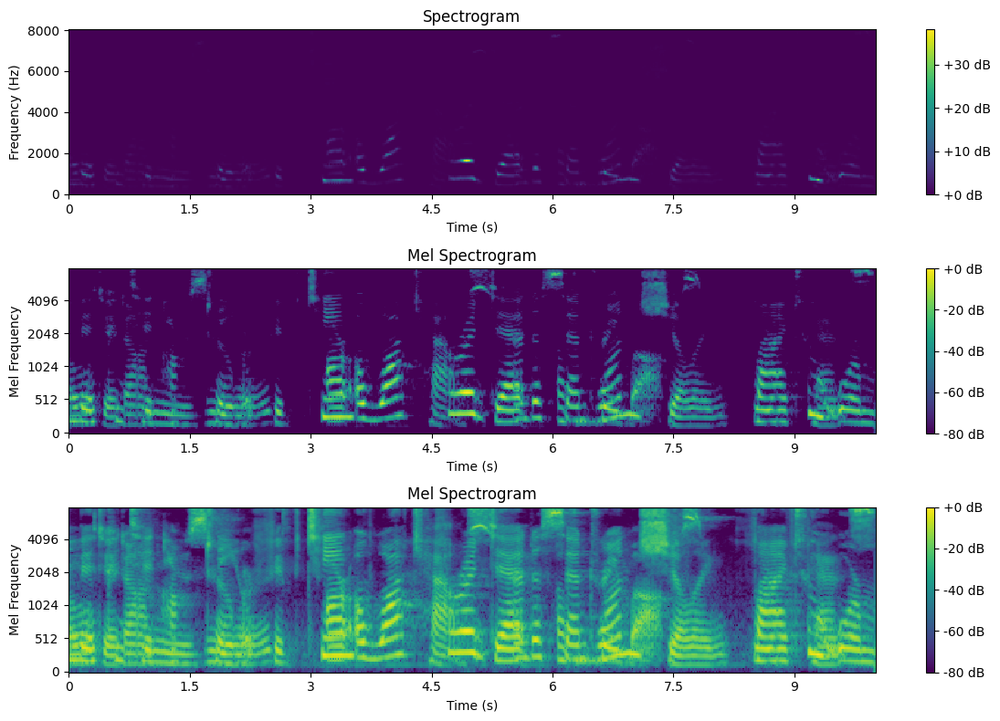

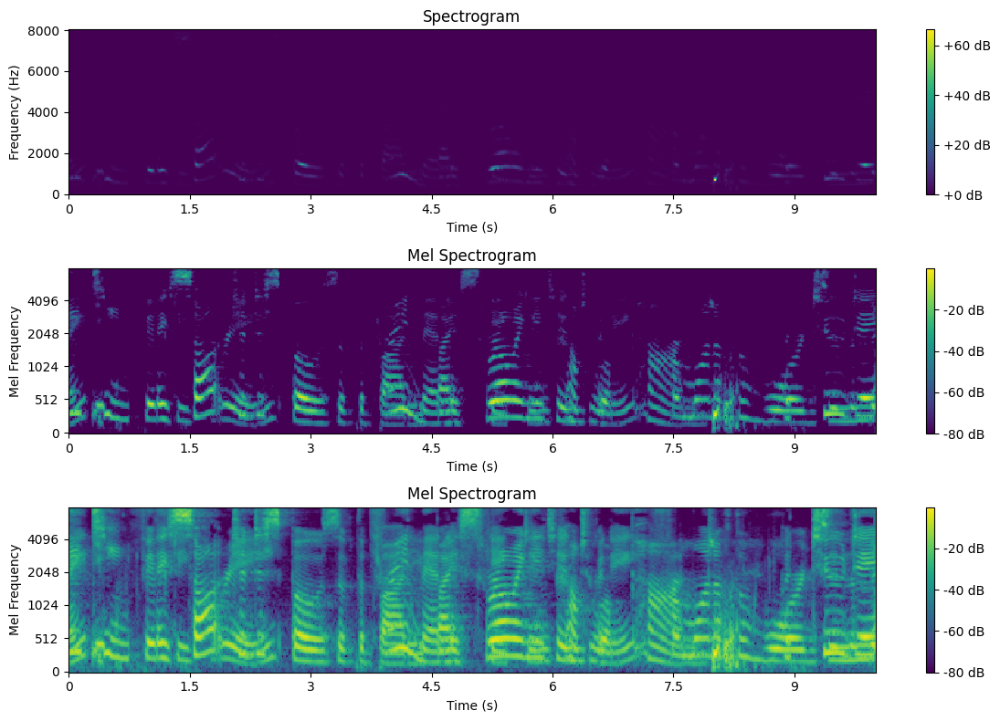

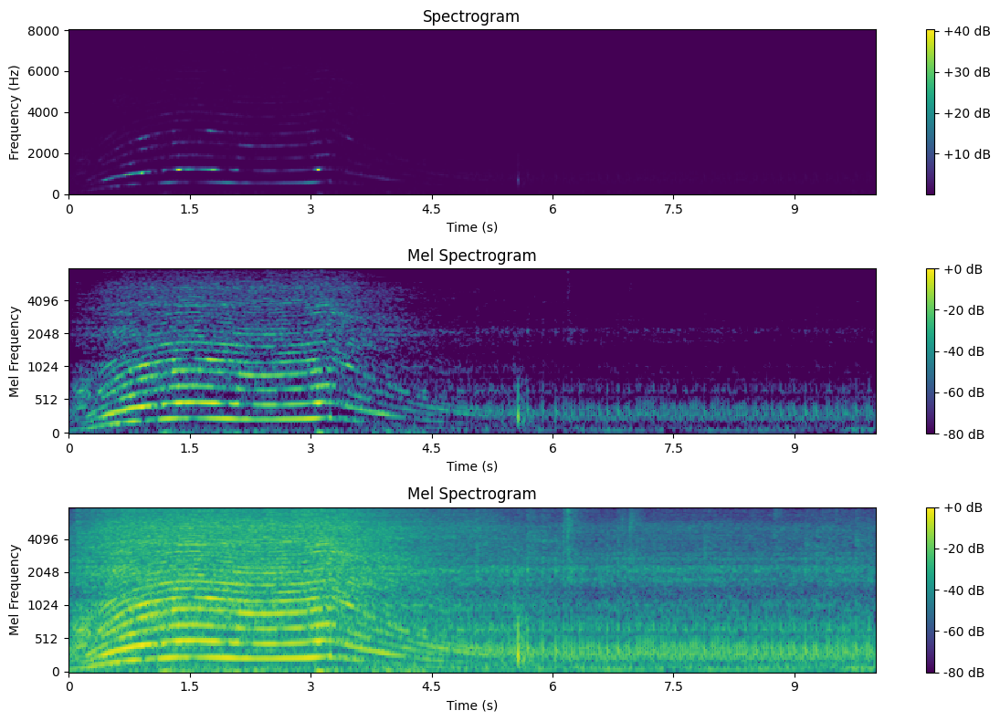

In [ ]:
CONFIG.N_MELS = 128
CONFIG.N_FFT = 512
visual_mel_spectro(test_realreal_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(test_realfake_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(test_fakefake_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(test_outlier_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))

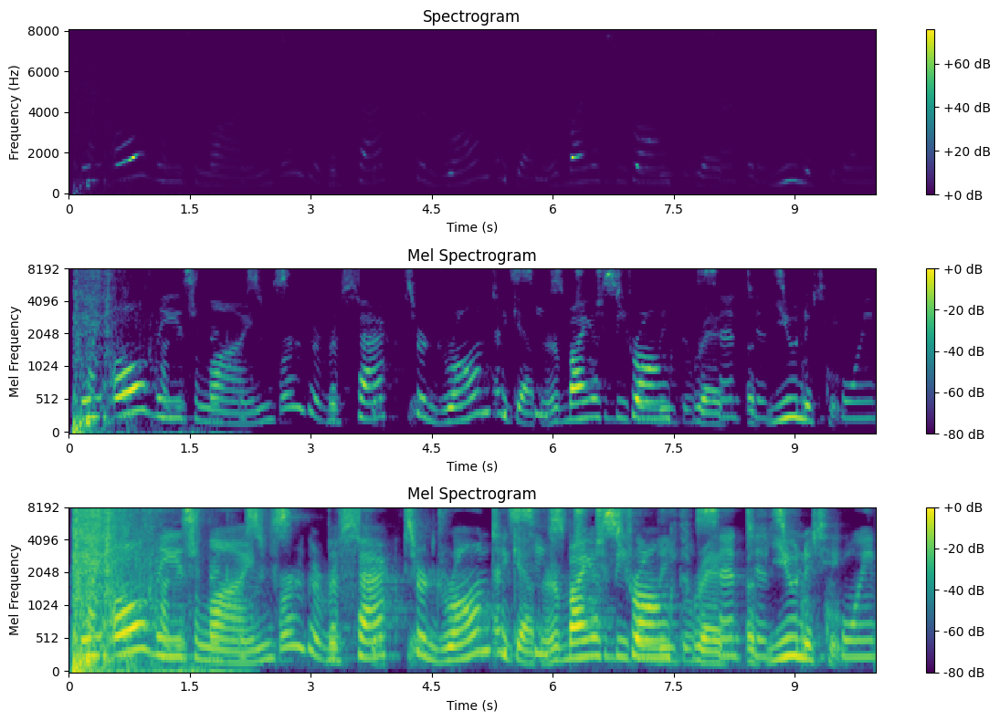

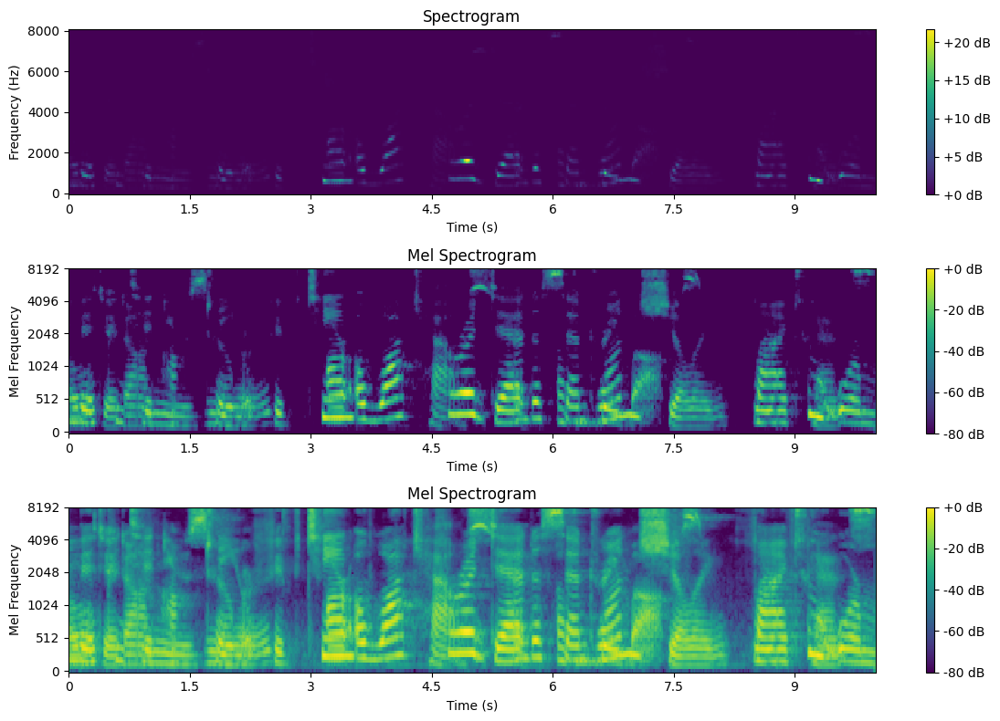

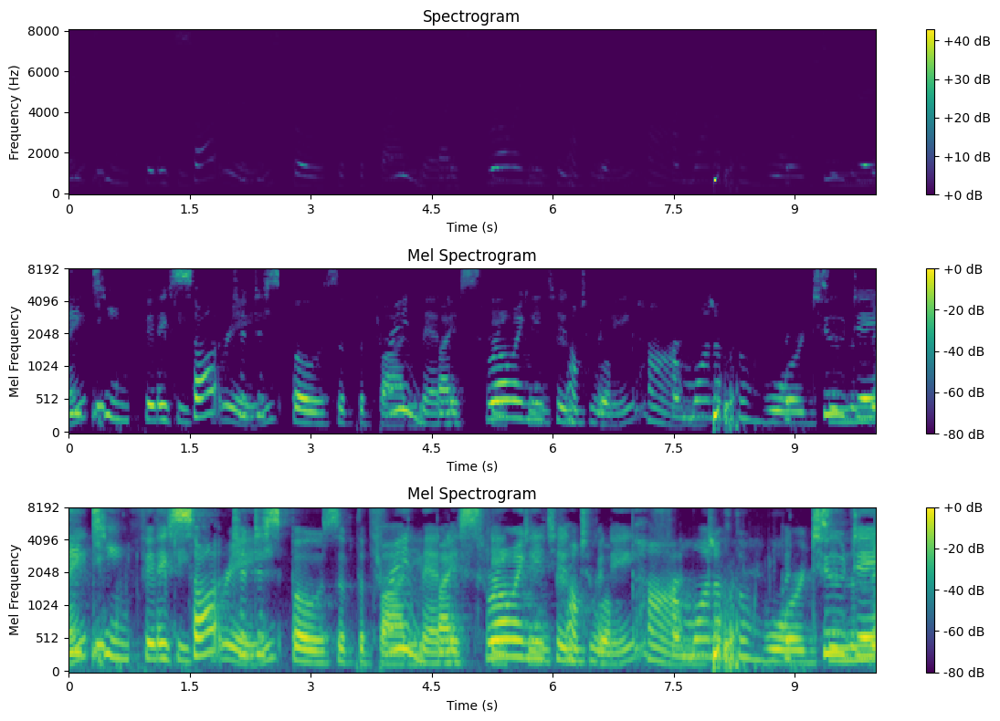

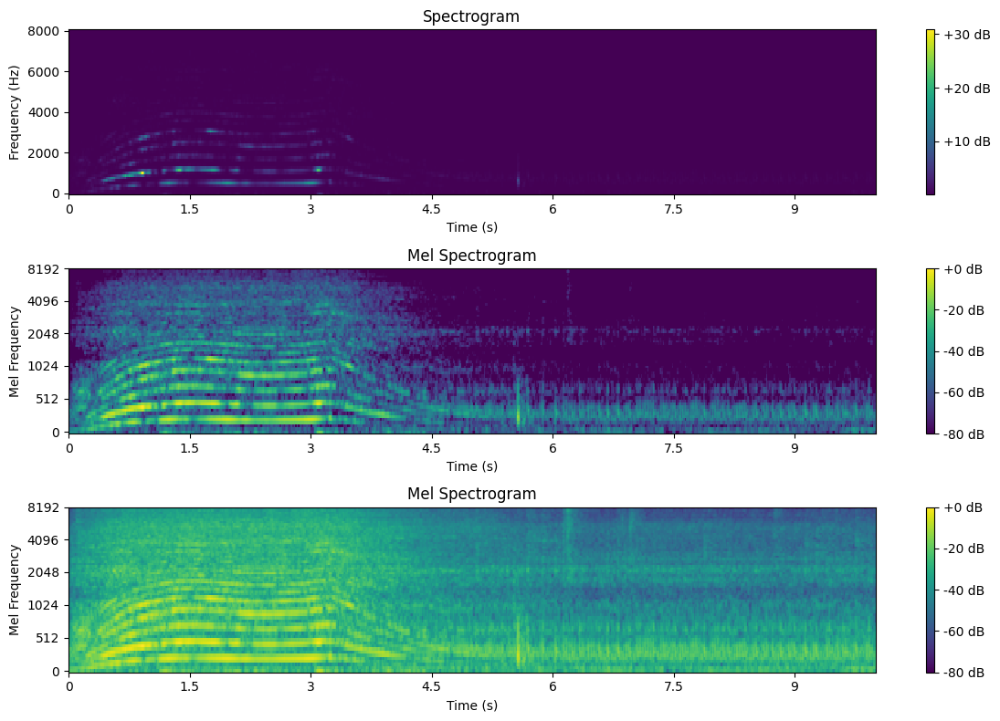

In [ ]:
CONFIG.N_MELS = 64
CONFIG.N_FFT = 512
visual_mel_spectro(test_realreal_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(test_realfake_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(test_fakefake_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(test_outlier_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))

# Train + Transformer

In [ ]:
from torchvision import transforms
from PIL import Image

import librosa
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
from PIL import Image
from torchvision import transforms

def numpy_to_pil(image):
    return Image.fromarray((image * 255).astype(np.uint8))

def pil_to_numpy(image):
    return np.array(image).astype(np.float32) / 255.0

def visual_augment_mel_spectro(y, sr, N_MELS, N_FFT, HOP_LENGTH):
    # 데이터 증강
    transform = transforms.Compose([
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomRotation(10)
    ])

    # Mel 스펙트로그램 계산
    mel_specgram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=N_FFT, hop_length=HOP_LENGTH, n_mels=N_MELS, fmin=0.0, fmax=sr/2)
    mel_specgram = librosa.amplitude_to_db(mel_specgram, ref=np.max)
    print(mel_specgram)

    # Mel 스펙트로그램을 PIL 이미지로 변환하여 증강 적용
    mel_specgram_pil = numpy_to_pil(mel_specgram)
    mel_specgram_pil = transform(mel_specgram_pil)
    mel_specgram_aug = pil_to_numpy(mel_specgram_pil)
    print(mel_specgram_aug)

    # 시각화
    plt.figure(figsize=(12, 8))

    # Mel 스펙트로그램 시각화
    plt.subplot(2, 1, 1)
    librosa.display.specshow(mel_specgram, sr=sr, hop_length=HOP_LENGTH, x_axis='time', y_axis='linear', cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Original Mel Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')

    # 증강된 Mel 스펙트로그램 시각화
    plt.subplot(2, 1, 2)
    librosa.display.specshow(mel_specgram_aug, sr=sr, hop_length=HOP_LENGTH, x_axis='time', y_axis='linear', cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Augmented Mel Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')

    plt.tight_layout()
    plt.show()

'''
def visual_augment_mel_spectro(y, sr, N_MELS, N_FFT, HOP_LENGTH):
    # 데이터 증강!!
    transform = transforms.RandomHorizontalFlip()

    # Mel 스펙트로그램 계산
    mel_specgram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=N_FFT, hop_length=HOP_LENGTH, n_mels=N_MELS, fmin=0.0, fmax=sr/2)
    mel_specgram = transform(mel_specgram) # 증강 = [0,0]

    # Log 변환
    log_mel_specgram = librosa.amplitude_to_db(mel_specgram, ref=np.max)
    log_mel_specgram = transform(log_mel_specgram) # 증강 = [0,0]

    #
    power_mel_specgram = librosa.power_to_db(mel_specgram, ref=np.max)
    power_mel_specgram = transform(power_mel_specgram) # 증강 = [0,0]

    # 시각화
    plt.figure(figsize=(12, 8))

    # Mel 스펙트로그램 시각화
    plt.subplot(3, 1, 1)
    librosa.display.specshow(mel_specgram, sr=sr, hop_length=CONFIG.HOP_LENGTH, x_axis='time', y_axis='linear', cmap='viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')

    # Log Mel 스펙트로그램 시각화
    plt.subplot(3, 1, 2)
    librosa.display.specshow(log_mel_specgram, sr=sr, hop_length=CONFIG.HOP_LENGTH, x_axis='time', y_axis='mel', cmap='viridis', vmin=np.nanmin(log_mel_specgram), vmax=np.nanmax(log_mel_specgram))
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Mel Frequency')

    # Power Mel 스펙트로그램 시각화
    plt.subplot(3, 1, 3)
    librosa.display.specshow(power_mel_specgram, sr=sr, hop_length=CONFIG.HOP_LENGTH, x_axis='time', y_axis='mel', cmap='viridis', vmin=np.nanmin(log_mel_specgram), vmax=np.nanmax(log_mel_specgram))
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Mel Frequency')

    plt.tight_layout()
    plt.show()
'''

"\ndef visual_augment_mel_spectro(y, sr, N_MELS, N_FFT, HOP_LENGTH):\n    # 데이터 증강!!\n    transform = transforms.RandomHorizontalFlip()\n\n    # Mel 스펙트로그램 계산\n    mel_specgram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=N_FFT, hop_length=HOP_LENGTH, n_mels=N_MELS, fmin=0.0, fmax=sr/2)\n    mel_specgram = transform(mel_specgram) # 증강 = [0,0]\n\n    # Log 변환\n    log_mel_specgram = librosa.amplitude_to_db(mel_specgram, ref=np.max)\n    log_mel_specgram = transform(log_mel_specgram) # 증강 = [0,0]\n\n    # \n    power_mel_specgram = librosa.power_to_db(mel_specgram, ref=np.max)\n    power_mel_specgram = transform(power_mel_specgram) # 증강 = [0,0]\n\n    # 시각화\n    plt.figure(figsize=(12, 8))\n\n    # Mel 스펙트로그램 시각화\n    plt.subplot(3, 1, 1)\n    librosa.display.specshow(mel_specgram, sr=sr, hop_length=CONFIG.HOP_LENGTH, x_axis='time', y_axis='linear', cmap='viridis')\n    plt.colorbar(format='%+2.0f dB')\n    plt.title('Spectrogram')\n    plt.xlabel('Time (s)')\n    plt.ylabel('Frequ

[[-68.56941  -66.18832  -51.9904   ... -80.       -80.       -80.      ]
 [-72.29892  -71.6858   -51.91123  ... -80.       -80.       -80.      ]
 [-79.144875 -80.       -51.708817 ... -80.       -80.       -80.      ]
 ...
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


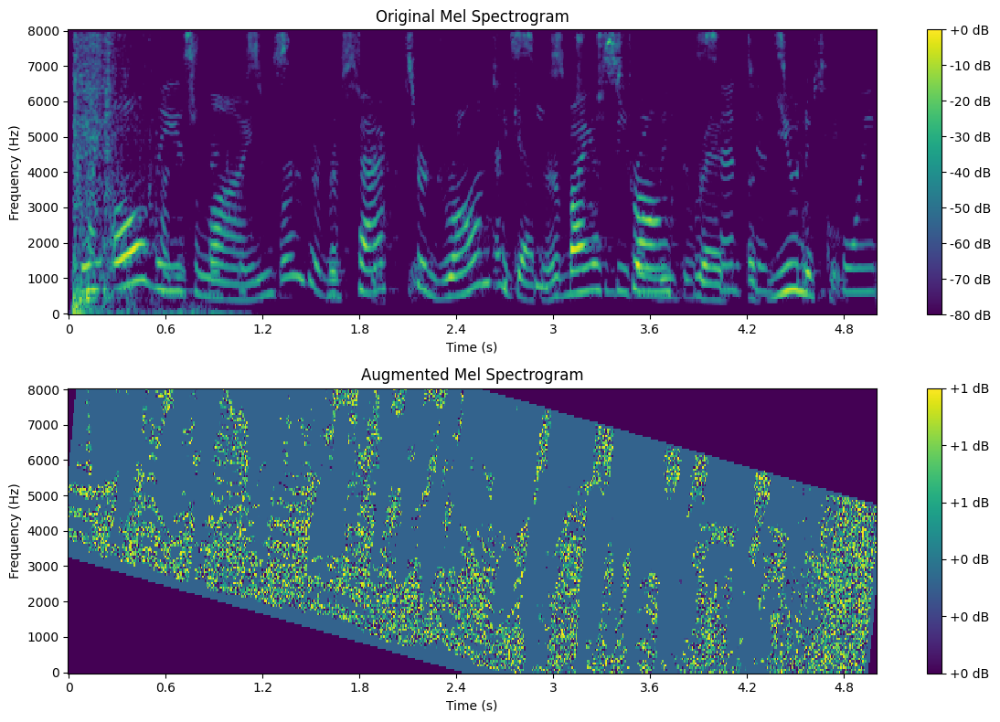

[[-63.23511  -72.89938  -80.       ... -80.       -73.23879  -63.274517]
 [-61.157017 -71.82831  -80.       ... -80.       -75.06023  -63.010715]
 [-59.316124 -70.72739  -80.       ... -80.       -77.3221   -62.625748]
 ...
 [-80.       -80.       -80.       ... -64.43916  -70.42836  -80.      ]
 [-80.       -80.       -80.       ... -76.12132  -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]]
[[0.         0.3137255  0.3137255  ... 0.         0.         0.        ]
 [0.         0.3137255  0.3137255  ... 0.         0.         0.        ]
 [0.         0.3137255  0.3137255  ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.3137255  0.10196079 0.        ]
 [0.         0.         0.         ... 0.5764706  0.3137255  0.        ]
 [0.         0.         0.         ... 0.8117647  0.10980392 0.        ]]


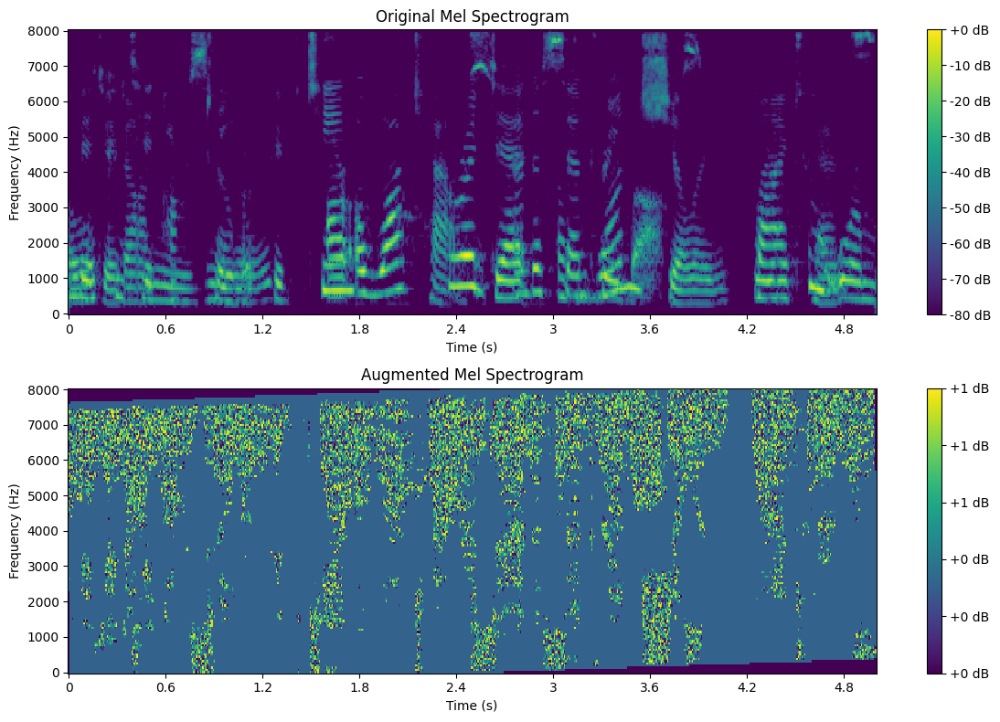

[[-66.57285  -75.91708  -80.       ... -80.       -80.       -74.88982 ]
 [-66.03028  -76.68379  -80.       ... -80.       -80.       -75.505325]
 [-65.38371  -77.42838  -80.       ... -80.       -80.       -76.06583 ]
 ...
 [-80.       -77.47897  -76.69209  ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


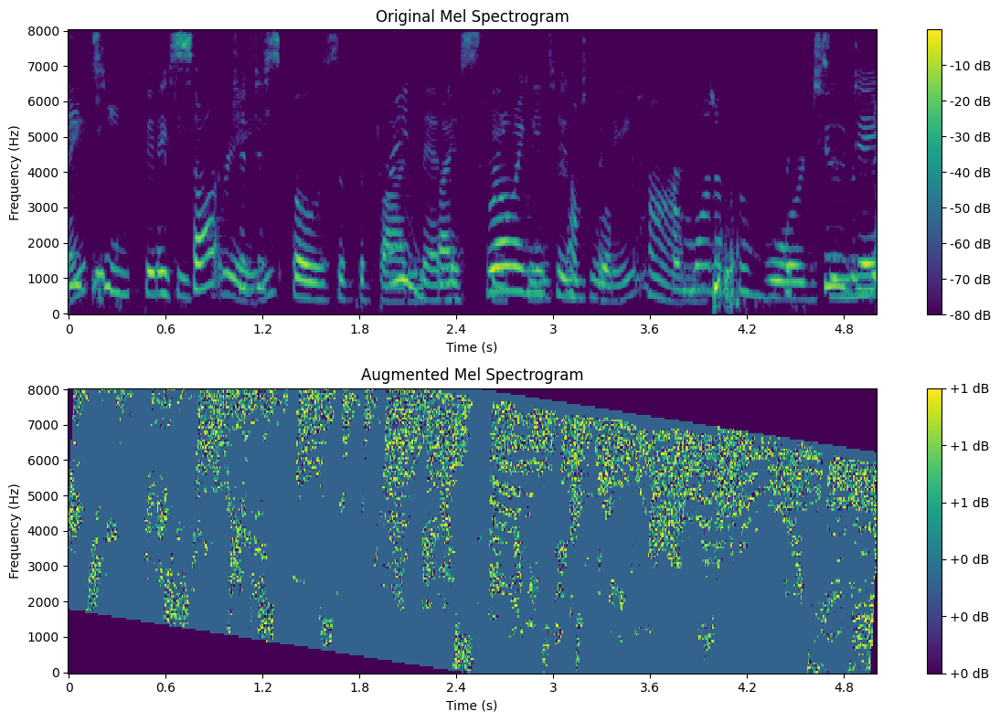

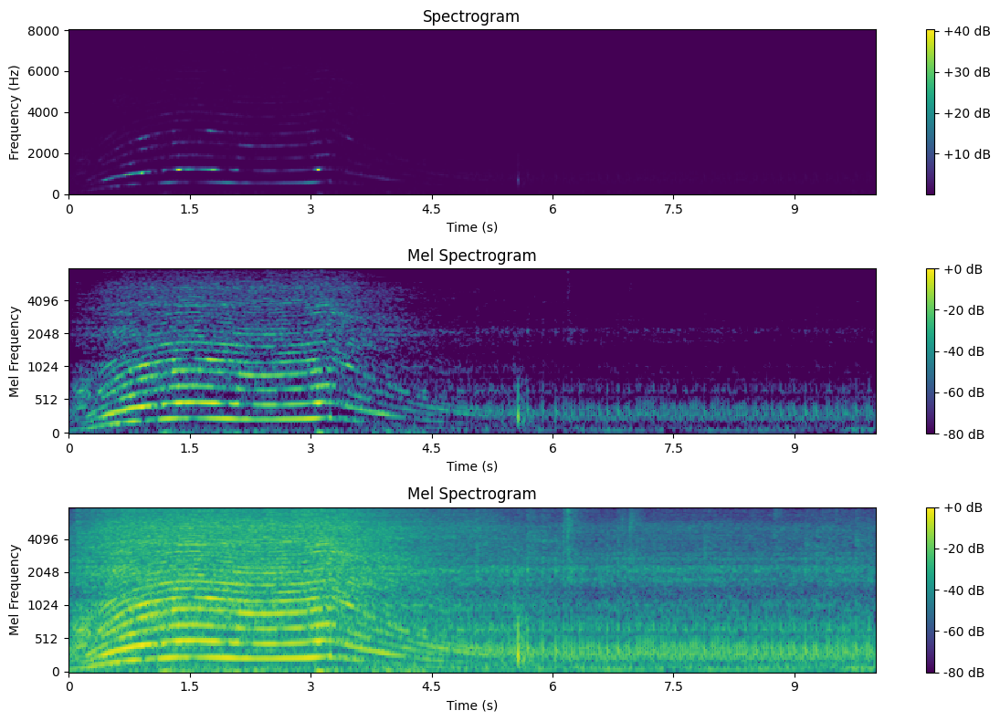

[[-34.33899  -39.338303 -42.125084 ... -67.48919  -68.36623  -71.49783 ]
 [-32.957832 -31.560205 -32.655563 ... -69.68112  -68.44104  -69.35729 ]
 [-31.612932 -27.309914 -28.012869 ... -72.59897  -68.39695  -67.47516 ]
 ...
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]
 [-80.       -80.       -80.       ... -80.       -80.       -80.      ]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


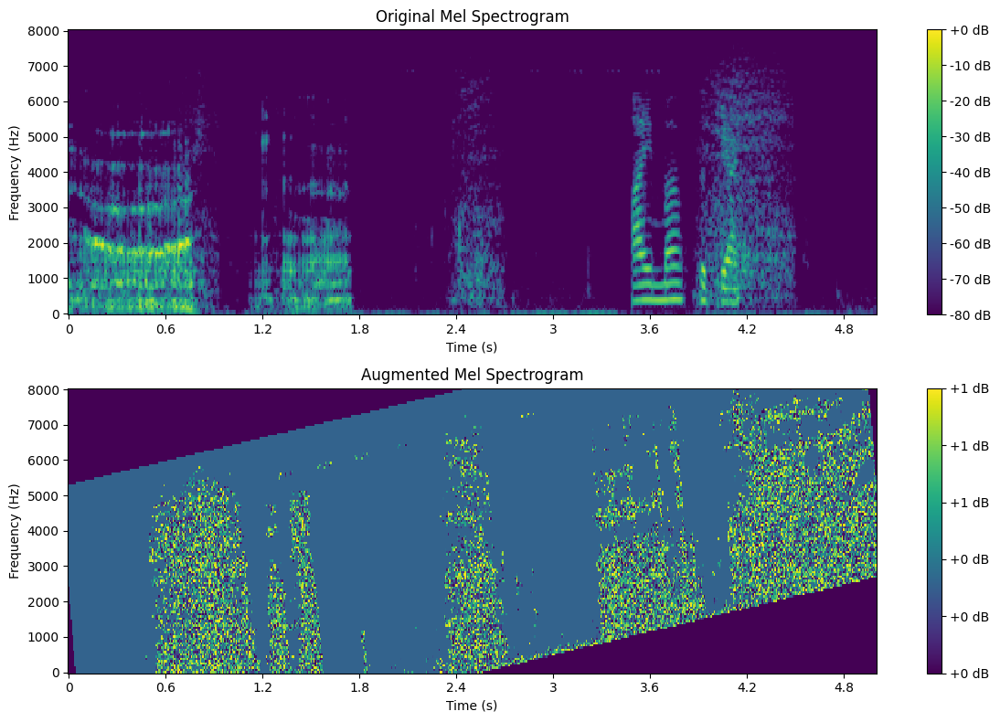

In [ ]:
CONFIG.N_MELS = 128
CONFIG.N_FFT = 512

visual_augment_mel_spectro(test_realreal_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_augment_mel_spectro(test_realfake_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_augment_mel_spectro(test_fakefake_y, real_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_mel_spectro(test_outlier_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))
visual_augment_mel_spectro(test_y, fake_sr, CONFIG.N_MELS, CONFIG.N_FFT, (int)(CONFIG.N_FFT/4))

[결과]
128, 512 -> ampli 64,256->power, 64,512->amplo


Mel spectrogram 데이터를 사용할 때, 분류 성능을 높이기 위해 보통 두 가지 로그 스케일링 방법 중 하나를 선택합니다:

Log-Amplitude Mel Spectrogram: log_mels = librosa.amplitude_to_db(mels, ref=np.max)
Log-Power Mel Spectrogram: log_mels_db = librosa.power_to_db(log_mels, ref=np.max)

- 데이터 증강
- transformers는 PIL 이미지 기반이라 별로

In [ ]:
import librosa
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import librosa.display
from PIL import Image

class MelSpectrogramDataset(Dataset):
    def __init__(self, file_paths, labels, sr=22050, n_mels=128, n_fft=2048, hop_length=512, transform=None):
        self.file_paths = file_paths
        self.labels = labels
        self.sr = sr
        self.n_mels = n_mels
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.transform = transform

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        y, sr = librosa.load(self.file_paths[idx], sr=self.sr)
        if self.transform:
            y = self.transform(y)
        mel_spec = librosa.feature.melspectrogram(y, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length, n_mels=self.n_mels)
        mel_spec_db = librosa.amplitude_to_db(mel_spec, ref=np.max)
        return mel_spec_db, self.labels[idx]

class TimeShift:
    def __init__(self, max_shift):
        self.max_shift = max_shift

    def __call__(self, y):
        shift = np.random.randint(-self.max_shift, self.max_shift)
        return np.roll(y, shift)

class PitchShift:
    def __init__(self, sr, n_steps):
        self.sr = sr
        self.n_steps = n_steps

    def __call__(self, y):
        steps = np.random.randint(-self.n_steps, self.n_steps)
        return librosa.effects.pitch_shift(y, self.sr, n_steps=steps)

class AddNoise:
    def __init__(self, noise_factor):
        self.noise_factor = noise_factor

    def __call__(self, y):
        noise = np.random.randn(len(y))
        return y + self.noise_factor * noise

class TimeStretch:
    def __init__(self, rate):
        self.rate = rate

    def __call__(self, y):
        rate = np.random.uniform(1 - self.rate, 1 + self.rate)
        return librosa.effects.time_stretch(y, rate)

transform = transforms.Compose([
    TimeShift(max_shift=500),
    PitchShift(sr=22050, n_steps=2),
    AddNoise(noise_factor=0.005),
    TimeStretch(rate=0.2),
])

file_paths = ['audio1.wav', 'audio2.wav', 'audio3.wav']
labels = [[1, 1], [1, 0], [0, 1]]

dataset = MelSpectrogramDataset(file_paths, labels, transform=transform)

# 데이터 로더 설정
train_loader = DataLoader(dataset, batch_size=16, shuffle=True)

# 데이터 확인
for mel_spec, label in dataset:
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(mel_spec, sr=22050, hop_length=512, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Log-Amplitude Mel Spectrogram')
    plt.show()
    print(label)
